## Plots variance distribution

I am exploring different parameters for showing the change in the distribution of variance between using all AceView transcripts and the restricted set of transcripts with at least 75% of their events detected at APN>5.

Ideally, we want to see that the variance is smaller in the restricted set versus the complete set.

In [38]:
# Load packages

import numpy
import matplotlib
import pandas
import math
import os
import scipy
from scipy import stats, integrate
from IPython.display import Image

import seaborn

seaborn.set(color_codes=True)
matplotlib.use('Agg')

import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from matplotlib.patches import Polygon
%matplotlib inline

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

/usr/local/software/anaconda/4-3-1/lib/python3.6/site-packages/matplotlib/__init__.py:1401: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


### Parameter 1: variance of log-transformed TPM on all possible transcripts

Here I am plotting the distribution of the variance between the complete vs the restricted set. I am going to plot the variances for all transcripts and the set of transcripts in common, where the variance is >0 (since a zero variance is not informative).

In [94]:
# Import data

mcLab=os.environ["MCLAB"]

allXSdata=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/hg19_aceview_all_transcripts_variance.csv',
                           delimiter=",", names=True,
                          dtype=[('transcript_id','|S64'),('var_cd19','<f8'),('var_cd4','<f8'),('var_cd8','<f8'),
                                ('flag_cd4_on','<f8'),('flag_cd8_on','<f8'),('flag_cd19_on','<f8'),
                                 ('flag_filter','<f8')])
# Index  Variable        Description
# 0      transcript_id   transcript ID
# 1      var_cd19        variance in CD19+
# 2      var_cd4         variance in CD4+
# 3      var_cd8         variance in CD8+
# 4      flag_cd4_on     flag if transcript is on in CD4+
# 5      flag_cd8_on     flag if transcript is on in CD8+
# 6      flag_cd19_on    flag if transcript is on in CD19+
# 7      flag_filter     transcript is in filtered list

filtXSdata=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/hg19_aceview_75perc_apn5_transcripts_variance.csv',
                           delimiter=",", names=True,
                          dtype=[('transcript_id','|S64'),('var_cd19','<f8'),('var_cd4','<f8'),('var_cd8','<f8'),
                                ('flag_cd4_on','<f8'),('flag_cd8_on','<f8'),('flag_cd19_on','<f8')])


# Index  Variable        Description
# 0      transcript_id   transcript ID
# 1      var_cd19        variance in CD19+
# 2      var_cd4         variance in CD4+
# 3      var_cd8         variance in CD8+
# 4      flag_cd4_on     flag if transcript is on in CD4+
# 5      flag_cd8_on     flag if transcript is on in CD8+
# 6      flag_cd19_on    flag if transcript is on in CD19+


In [95]:
## Set up various dataframes

# I want the following comparisons:
# Complete vs Filtered -- all possible transcripts in each (comparison 1)
# Complete vs Filtered -- all detected transcripts in each (comparison 2)
# Complete vs Filtered -- all common transcripts (comparison 3)
# Complete vs Filtered -- all common transcripts and detected  (comparison 4)

list1CD4all=[]
list1CD4filt=[]
list2CD4all=[]

list1CD8all=[]
list1CD8filt=[]
list2CD8all=[]

list1CD19all=[]
list1CD19filt=[]
list2CD19all=[]


## for all transcripts
for i in range(0,len(allXSdata)):
    if allXSdata[i][2] > 0:
        list1CD4all.append(allXSdata[i][2])
        if allXSdata[i][7] == 1:
            list2CD4all.append(allXSdata[i][2])
    if allXSdata[i][3] > 0:
        list1CD8all.append(allXSdata[i][3])
        if allXSdata[i][7] == 1:
            list2CD8all.append(allXSdata[i][3])
    if allXSdata[i][1] > 0:
        list1CD19all.append(allXSdata[i][1])
        if allXSdata[i][7] == 1:
            list2CD19all.append(allXSdata[i][1])

## for filtered transcripts
for i in range(0,len(filtXSdata)):
    if allXSdata[i][2] > 0:
        list1CD4filt.append(filtXSdata[i][2])
    if allXSdata[i][3] > 0:
        list1CD8filt.append(filtXSdata[i][3])
    if allXSdata[i][1] > 0:
        list1CD19filt.append(filtXSdata[i][1])
    
# Index  Variable        Description
# 0      transcript_id   transcript ID
# 1      var_cd19        variance in CD19+
# 2      var_cd4         variance in CD4+
# 3      var_cd8         variance in CD8+
# 4      flag_cd4_on     flag if transcript is on in CD4+
# 5      flag_cd8_on     flag if transcript is on in CD8+
# 6      flag_cd19_on    flag if transcript is on in CD19+




#### Comparison 1 : all transcripts

/usr/local/software/anaconda/4-3-1/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


<function matplotlib.pyplot.legend>

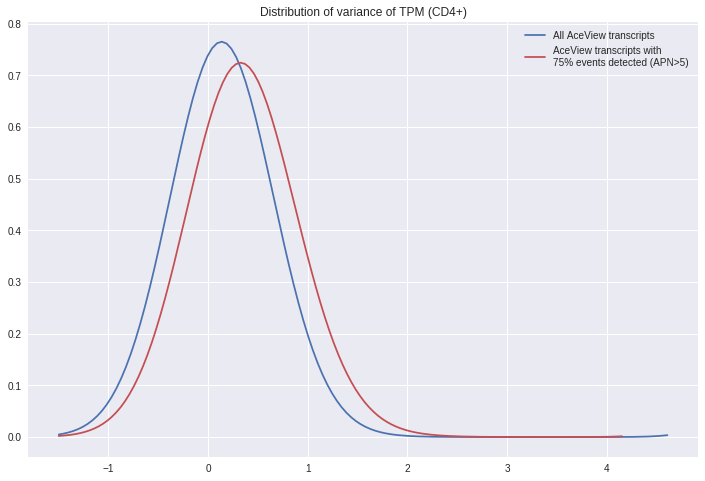

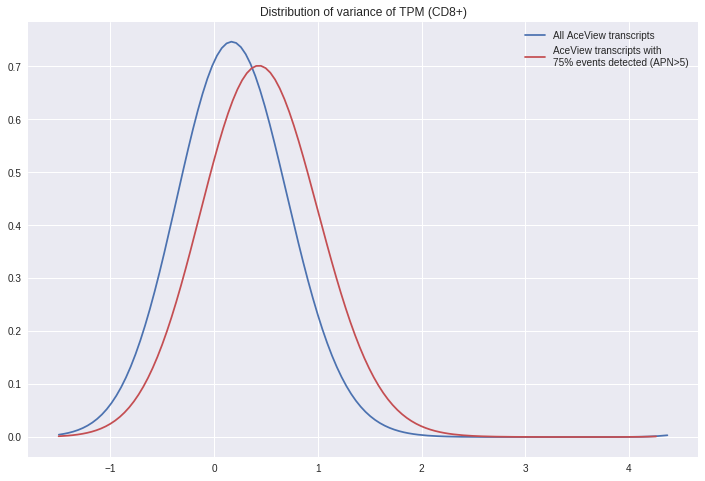

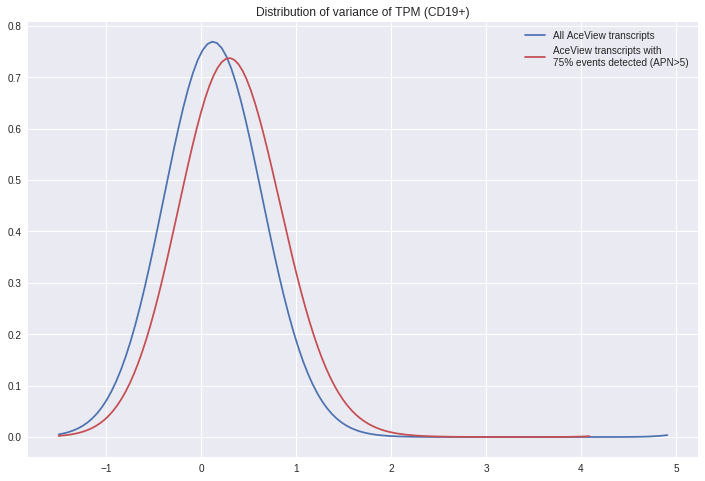

In [96]:
## Comparison 1 -- no detection or common-ness filtering

x1=numpy.asarray(list1CD4all)
y1=numpy.asarray(list1CD4filt)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x1, bw=0.5, label="All AceView transcripts", color="b")
seaborn.kdeplot(y1, bw=0.5, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of variance of TPM (CD4+)")
plt.legend

x2=numpy.asarray(list1CD8all)
y2=numpy.asarray(list1CD8filt)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x2, bw=0.5, label="All AceView transcripts", color="b")
seaborn.kdeplot(y2, bw=0.5, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of variance of TPM (CD8+)")
plt.legend

x3=numpy.asarray(list1CD19all)
y3=numpy.asarray(list1CD19filt)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x3, bw=0.5, label="All AceView transcripts", color="b")
seaborn.kdeplot(y3, bw=0.5, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of variance of TPM (CD19+)")
plt.legend


#### Comparison 2 : common transcripts

/usr/local/software/anaconda/4-3-1/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


<function matplotlib.pyplot.legend>

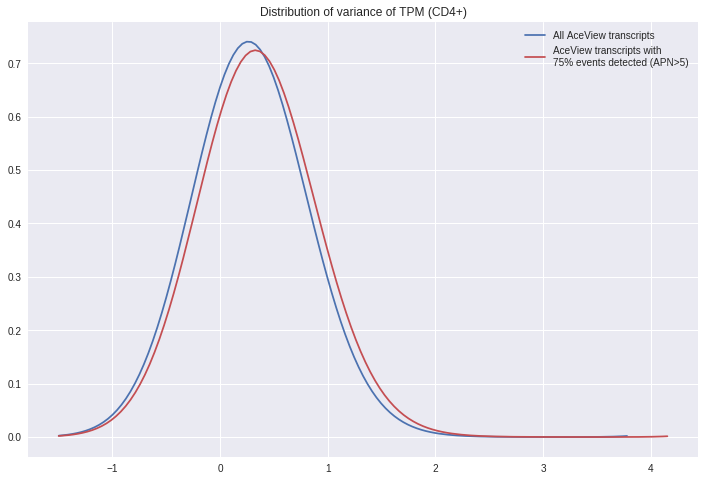

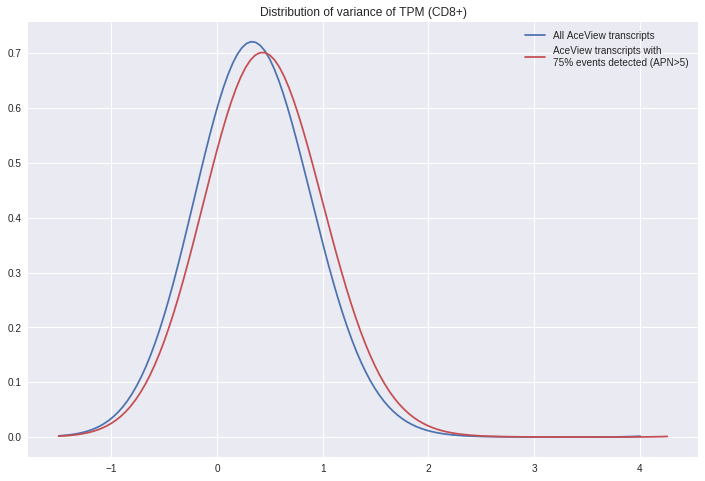

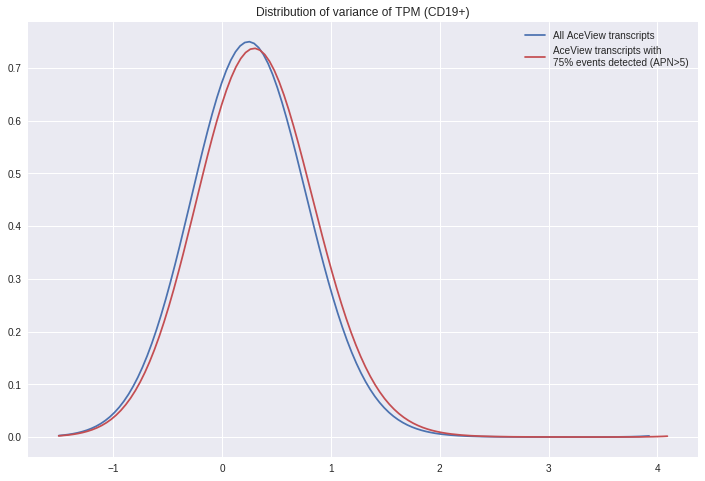

In [97]:
## Comparison 2 -- common transcripts

x1=numpy.asarray(list2CD4all)
y1=numpy.asarray(list1CD4filt)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x1, bw=0.5, label="All AceView transcripts", color="b")
seaborn.kdeplot(y1, bw=0.5, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of variance of TPM (CD4+)")
plt.legend

x2=numpy.asarray(list2CD8all)
y2=numpy.asarray(list1CD8filt)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x2, bw=0.5, label="All AceView transcripts", color="b")
seaborn.kdeplot(y2, bw=0.5, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of variance of TPM (CD8+)")
plt.legend

x3=numpy.asarray(list2CD19all)
y3=numpy.asarray(list1CD19filt)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x3, bw=0.5, label="All AceView transcripts", color="b")
seaborn.kdeplot(y3, bw=0.5, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of variance of TPM (CD19+)")
plt.legend

The distributions are pretty similar, with the restricted set of transcripts having a slightly higher variance than using all transcripts.

Next, I looked at the distribution of log-TPM per subject to see if these were relatively even across samples:

For the complete set of transcripts:

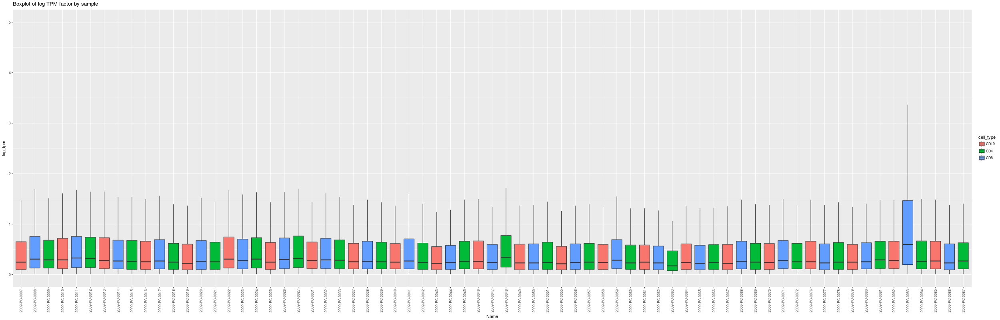

In [98]:
Image("/home/jrbnewman/McLab/event_analysis/analysis_output/tpm_by_subject_cell_all.png")

And for the restricted set:

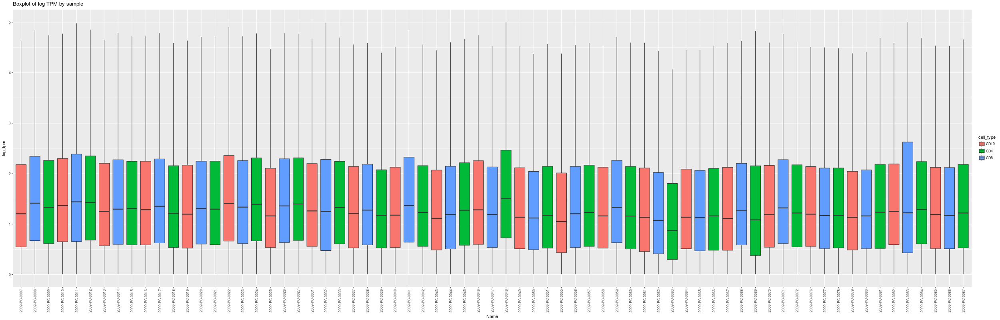

In [99]:
Image("/home/jrbnewman/McLab/event_analysis/analysis_output/tpm_by_subject_cell_filtered.png")

Two things to note:
    (1) the between-sample distributions are not even
    (2) estimates appear to be higher in the filtered set compared to the complete set. This is probably due to the prior eliminiation of low-abundance transcripts (which are kept in the complete set)
    
    
I then upper quartile-normalized both datasets. For the complete set of transcripts:

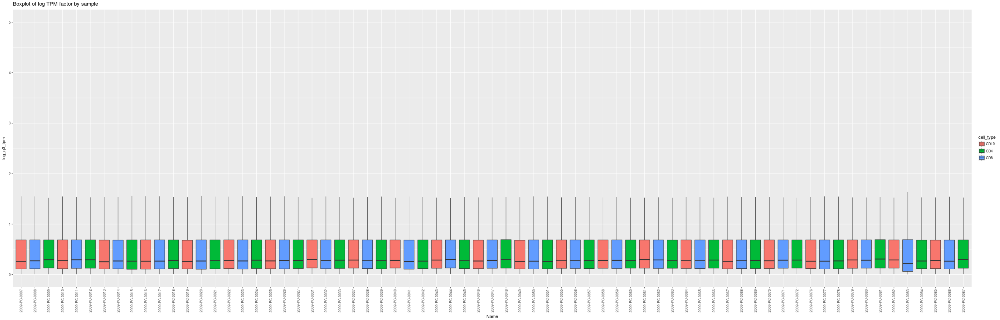

In [100]:
Image("/home/jrbnewman/McLab/event_analysis/analysis_output/tpm_by_subject_cell_all_q3norm.png")

And for the restricted set:

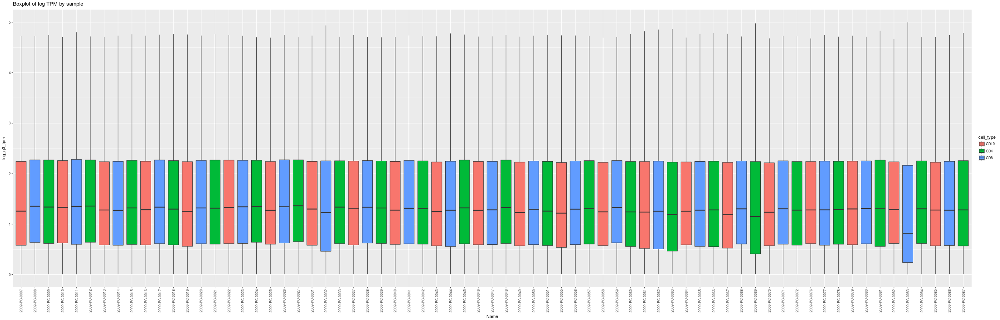

In [101]:
Image("/home/jrbnewman/McLab/event_analysis/analysis_output/tpm_by_subject_cell_filtered_q3norm.png")

These looked more "even" so I decided to redo the variance distributions on the normalized data

### Parameter 2: variance of log-transformed UQ-normalized TPM on all possible transcripts

In [102]:
# Import data

mcLab=os.environ["MCLAB"]

allXSdataQ3=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/hg19_aceview_all_transcripts_variance_q3norm.csv',
                           delimiter=",", names=True,
                          dtype=[('transcript_id','|S64'),('var_cd19','<f8'),('var_cd4','<f8'),('var_cd8','<f8'),
                                ('flag_cd4_on','<f8'),('flag_cd8_on','<f8'),('flag_cd19_on','<f8'),
                                 ('flag_filter','<f8')])


# Index  Variable        Description
# 0      transcript_id   transcript ID
# 1      var_cd19        variance in CD19+
# 2      var_cd4         variance in CD4+
# 3      var_cd8         variance in CD8+
# 4      flag_cd4_on     flag if transcript is on in CD4+
# 5      flag_cd8_on     flag if transcript is on in CD8+
# 6      flag_cd19_on    flag if transcript is on in CD19+
# 7      flag_filter     transcript is in filtered list

filtXSdataQ3=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/hg19_aceview_75perc_apn5_transcripts_variance_q3norm.csv',
                           delimiter=",", names=True,
                          dtype=[('transcript_id','|S64'),('var_cd19','<f8'),('var_cd4','<f8'),('var_cd8','<f8'),
                                ('flag_cd4_on','<f8'),('flag_cd8_on','<f8'),('flag_cd19_on','<f8')])


# Index  Variable        Description
# 0      transcript_id   transcript ID
# 1      var_cd19        variance in CD19+
# 2      var_cd4         variance in CD4+
# 3      var_cd8         variance in CD8+
# 4      flag_cd4_on     flag if transcript is on in CD4+
# 5      flag_cd8_on     flag if transcript is on in CD8+
# 6      flag_cd19_on    flag if transcript is on in CD19+


In [103]:

## Set up various dataframes

# I want the following comparisons:
# Complete vs Filtered -- all possible transcripts in each (comparison 1)
# Complete vs Filtered -- all detected transcripts in each (comparison 2)
# Complete vs Filtered -- all common transcripts (comparison 3)
# Complete vs Filtered -- all common transcripts and detected  (comparison 4)

list1CD4all=[]
list1CD4filt=[]
list2CD4all=[]

list1CD8all=[]
list1CD8filt=[]
list2CD8all=[]

list1CD19all=[]
list1CD19filt=[]
list2CD19all=[]

## for all transcripts
for i in range(0,len(allXSdataQ3)):
    if numpy.isnan(allXSdataQ3[i][2]) == False and allXSdataQ3[i][2] > 0:
        list1CD4all.append(allXSdataQ3[i][2])
        if allXSdataQ3[i][7] == 1:
            list2CD4all.append(allXSdataQ3[i][2])

    if numpy.isnan(allXSdataQ3[i][3]) == False and allXSdataQ3[i][3] > 0:
        list1CD8all.append(allXSdataQ3[i][3])
        if allXSdataQ3[i][7] == 1:
            list2CD8all.append(allXSdataQ3[i][3])

    if numpy.isnan(allXSdataQ3[i][1]) == False and allXSdataQ3[i][1] > 0:
        list1CD19all.append(allXSdataQ3[i][1])
        if allXSdataQ3[i][7] == 1:
            list2CD19all.append(allXSdataQ3[i][1])
   


## for filtered transcripts
for i in range(0,len(filtXSdataQ3)):
    if numpy.isnan(filtXSdataQ3[i][2]) == False and filtXSdataQ3[i][2] > 0:
        list1CD4filt.append(filtXSdataQ3[i][2])
    if numpy.isnan(filtXSdataQ3[i][3]) == False and filtXSdataQ3[i][3] > 0:
        list1CD8filt.append(filtXSdataQ3[i][3])
    if numpy.isnan(filtXSdataQ3[i][1]) == False and filtXSdataQ3[i][1] > 0:
        list1CD19filt.append(filtXSdataQ3[i][1])

        


#### Comparison 1 : all transcripts

/usr/local/software/anaconda/4-3-1/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


<function matplotlib.pyplot.legend>

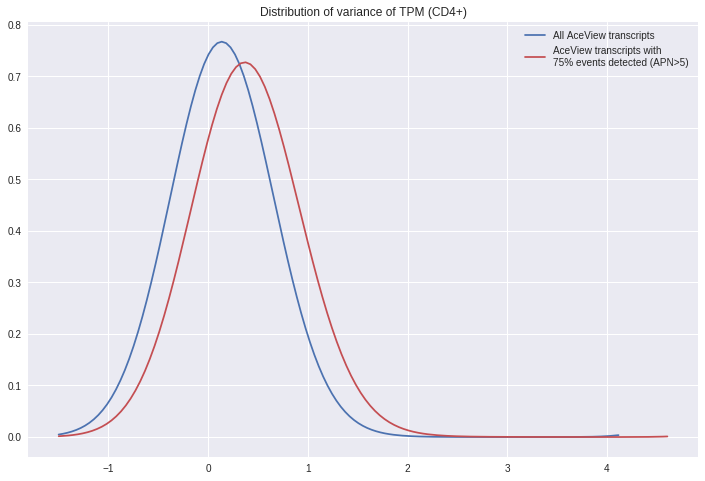

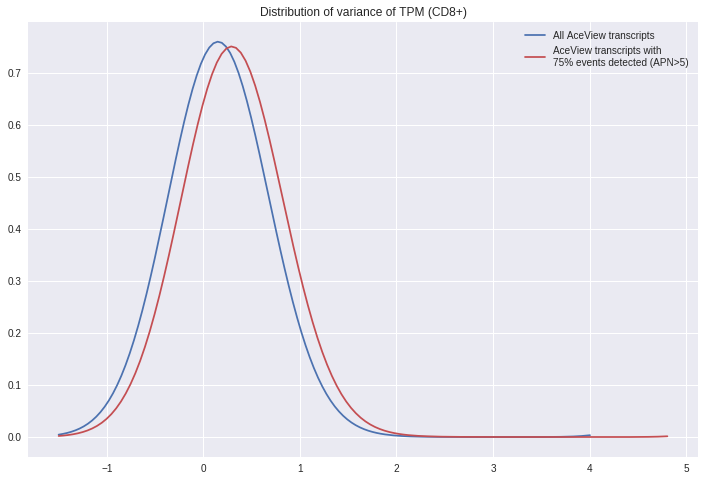

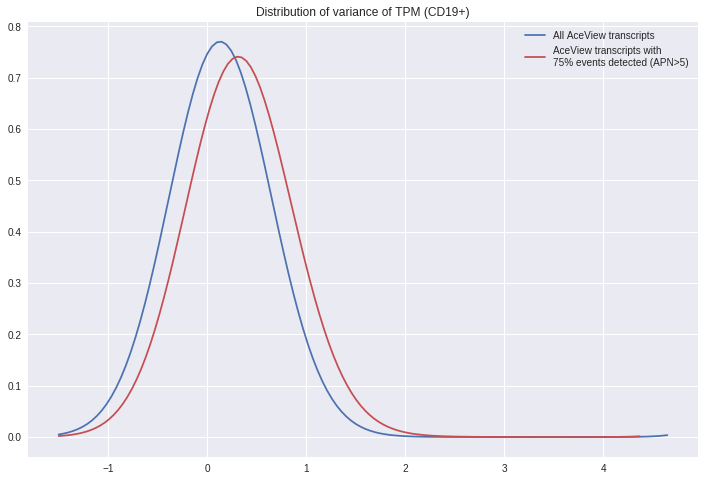

In [104]:

## Comparison 1 -- no detection or common-ness filtering

x1=numpy.asarray(list1CD4all)
y1=numpy.asarray(list1CD4filt)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x1, bw=0.5, label="All AceView transcripts", color="b")
seaborn.kdeplot(y1, bw=0.5, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of variance of TPM (CD4+)")
plt.legend

x2=numpy.asarray(list1CD8all)
y2=numpy.asarray(list1CD8filt)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x2, bw=0.5, label="All AceView transcripts", color="b")
seaborn.kdeplot(y2, bw=0.5, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of variance of TPM (CD8+)")
plt.legend

x3=numpy.asarray(list1CD19all)
y3=numpy.asarray(list1CD19filt)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x3, bw=0.5, label="All AceView transcripts", color="b")
seaborn.kdeplot(y3, bw=0.5, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of variance of TPM (CD19+)")
plt.legend



#### Comparison 2 : common transcripts

/usr/local/software/anaconda/4-3-1/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


<function matplotlib.pyplot.legend>

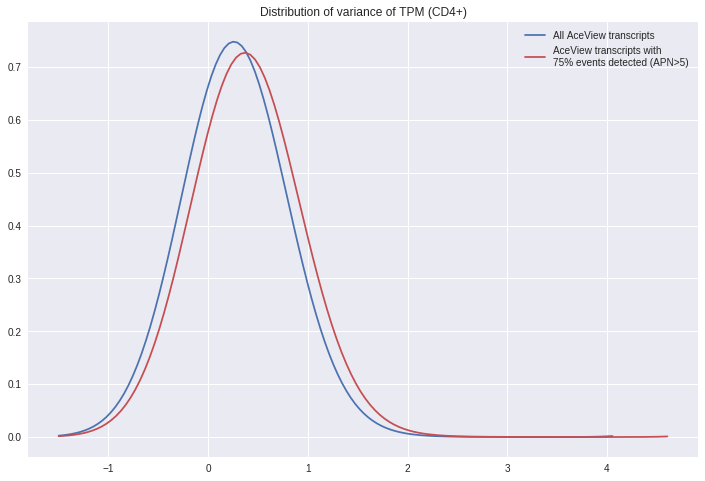

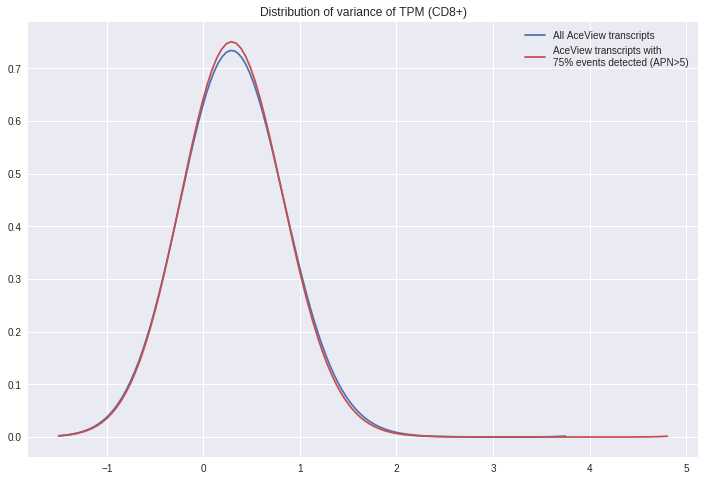

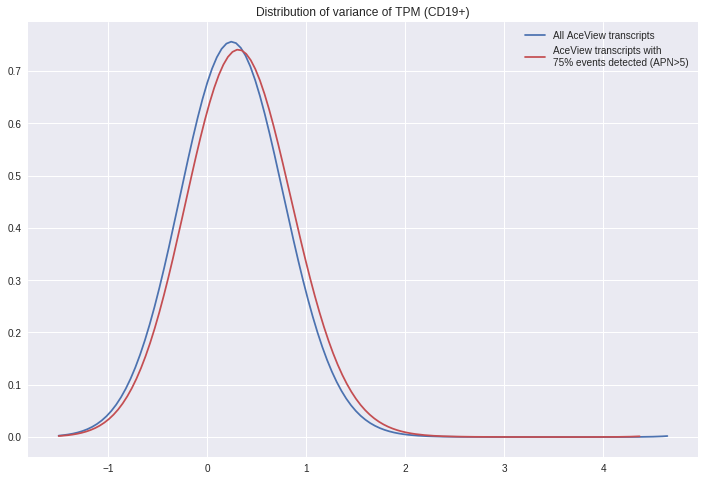

In [105]:


## Comparison 2 -- detection filtering

x1=numpy.asarray(list2CD4all)
y1=numpy.asarray(list1CD4filt)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x1, bw=0.5, label="All AceView transcripts", color="b")
seaborn.kdeplot(y1, bw=0.5, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of variance of TPM (CD4+)")
plt.legend

x2=numpy.asarray(list2CD8all)
y2=numpy.asarray(list1CD8filt)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x2, bw=0.5, label="All AceView transcripts", color="b")
seaborn.kdeplot(y2, bw=0.5, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of variance of TPM (CD8+)")
plt.legend

x3=numpy.asarray(list2CD19all)
y3=numpy.asarray(list1CD19filt)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x3, bw=0.5, label="All AceView transcripts", color="b")
seaborn.kdeplot(y3, bw=0.5, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of variance of TPM (CD19+)")
plt.legend

Again, little improvement and the restricted set tends to have a higher variance that the complete set. So UQ normalization did not help much.


### Scatterplot to compare variances

For each cell type and for the transcripts in common I am plotting the variance from the complete set and the restricted set to compare

In [111]:
# Import data

mcLab=os.environ["MCLAB"]

xsVarCompare=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/hg19_xscript_variances_common.csv',
                           delimiter=",", names=True,
                          dtype=[('transcript_id','|S64'),('var_cd19_all','<f8'),('var_cd4_all','<f8'),
                                 ('var_cd8_all','<f8'),('var_cd19_subset','<f8'),('var_cd4_subset','<f8'),
                                 ('var_cd8_subset','<f8')])


# Index  Variable       
# 0      transcript_id
# 1      var_cd19_all
# 2      var_cd4_all
# 3      var_cd8_all
# 4      var_cd19_subset
# 5      var_cd4_subset
# 6      var_cd8_subset


In [112]:
## Set up dataframes

cd4all=[]
cd8all=[]
cd19all=[]
cd4sub=[]
cd8sub=[]
cd19sub=[]

for i in range(0,len(xsVarCompare)):
    cd19all.append(xsVarCompare[i][1])
    cd4all.append(xsVarCompare[i][2])
    cd8all.append(xsVarCompare[i][3])
    cd19sub.append(xsVarCompare[i][4])
    cd4sub.append(xsVarCompare[i][5])
    cd8sub.append(xsVarCompare[i][6])

    

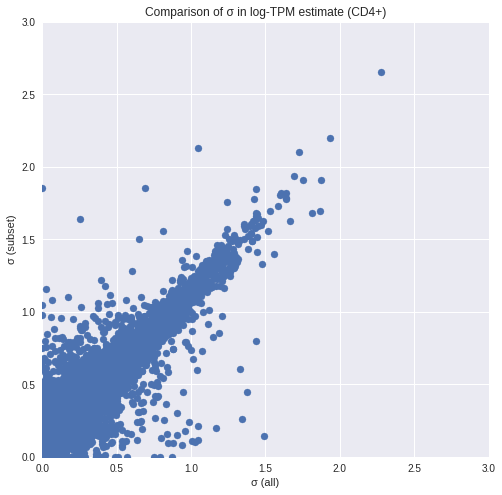

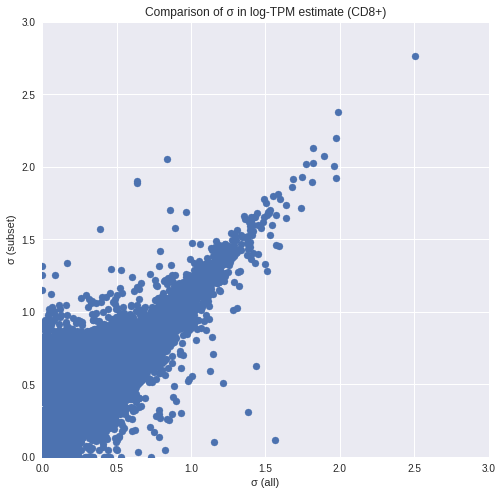

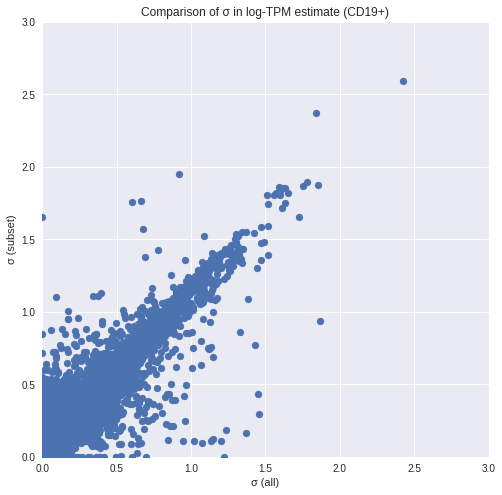

In [121]:
## Scatterplots

fig,ax = plt.subplots(figsize=(8,8))
pltCD4Var = ax.scatter(cd4all,cd4sub)

plt.xlim(0,3)
plt.ylim(0,3)
ax.set_ylabel('σ (subset)')
ax.set_xlabel('σ (all)')
ax.set_title('Comparison of σ in log-TPM estimate (CD4+)')
plt.show()


fig,ax = plt.subplots(figsize=(8,8))
pltCD8Var = ax.scatter(cd8all,cd8sub)

plt.xlim(0,3)
plt.ylim(0,3)
ax.set_ylabel('σ (subset)')
ax.set_xlabel('σ (all)')
ax.set_title('Comparison of σ in log-TPM estimate (CD8+)')
plt.show()


fig,ax = plt.subplots(figsize=(8,8))
pltCD18Var = ax.scatter(cd19all,cd19sub)

plt.xlim(0,3)
plt.ylim(0,3)
ax.set_ylabel('σ (subset)')
ax.set_xlabel('σ (all)')
ax.set_title('Comparison of σ in log-TPM estimate (CD19+)')
plt.show()

In [114]:
## Set up dataframes -- if var=0 for either then remove

cd4all2=[]
cd8all2=[]
cd19all2=[]
cd4sub2=[]
cd8sub2=[]
cd19sub2=[]

for i in range(0,len(xsVarCompare)):
    if xsVarCompare[i][1] > 0 and xsVarCompare[i][4] > 0:
        cd19all2.append(xsVarCompare[i][1])
        cd19sub2.append(xsVarCompare[i][4])
    if xsVarCompare[i][2] > 0 and xsVarCompare[i][5] > 0:
        cd4all2.append(xsVarCompare[i][2])
        cd4sub2.append(xsVarCompare[i][5])
    if xsVarCompare[i][3] > 0 and xsVarCompare[i][6] > 0:
        cd8all2.append(xsVarCompare[i][3])
        cd8sub2.append(xsVarCompare[i][6])

    

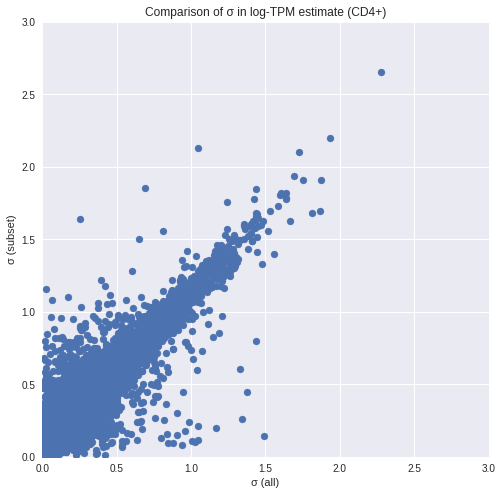

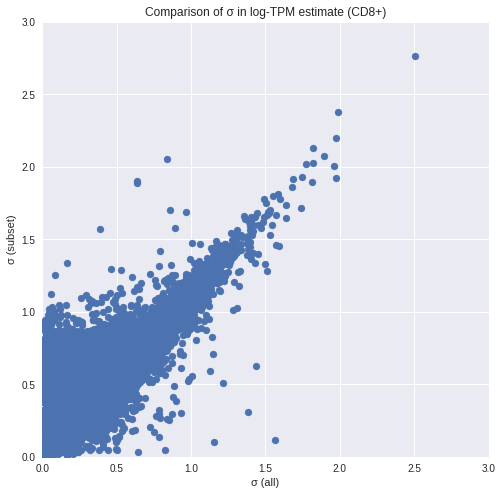

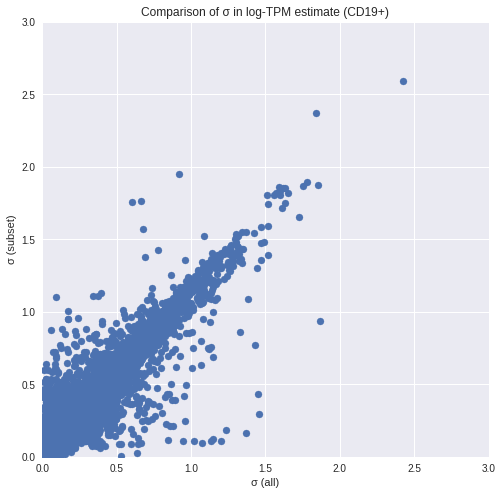

In [122]:
## Scatterplots

fig,ax = plt.subplots(figsize=(8,8))
pltCD4Var = ax.scatter(cd4all2,cd4sub2)

plt.xlim(0,3)
plt.ylim(0,3)
ax.set_ylabel('σ (subset)')
ax.set_xlabel('σ (all)')
ax.set_title('Comparison of σ in log-TPM estimate (CD4+)')
plt.show()


fig,ax = plt.subplots(figsize=(8,8))
pltCD8Var = ax.scatter(cd8all2,cd8sub2)

plt.xlim(0,3)
plt.ylim(0,3)
ax.set_ylabel('σ (subset)')
ax.set_xlabel('σ (all)')
ax.set_title('Comparison of σ in log-TPM estimate (CD8+)')
plt.show()


fig,ax = plt.subplots(figsize=(8,8))
pltCD18Var = ax.scatter(cd19all2,cd19sub2)

plt.xlim(0,3)
plt.ylim(0,3)
ax.set_ylabel('σ (subset)')
ax.set_xlabel('σ (all)')
ax.set_title('Comparison of σ in log-TPM estimate (CD19+)')
plt.show()

In [125]:
# Import data

mcLab=os.environ["MCLAB"]

xsVarCompareNoLog=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/hg19_xscript_variances_common_nolog.csv',
                           delimiter=",", names=True,
                          dtype=[('transcript_id','|S64'),('var_cd19_all','<f8'),('var_cd4_all','<f8'),
                                 ('var_cd8_all','<f8'),('var_cd19_subset','<f8'),('var_cd4_subset','<f8'),
                                 ('var_cd8_subset','<f8')])


# Index  Variable       
# 0      transcript_id
# 1      var_cd19_all
# 2      var_cd4_all
# 3      var_cd8_all
# 4      var_cd19_subset
# 5      var_cd4_subset
# 6      var_cd8_subset


In [126]:
## Set up dataframes

cd4allNoLog=[]
cd8allNoLog=[]
cd19allNoLog=[]
cd4subNoLog=[]
cd8subNoLog=[]
cd19subNoLog=[]

for i in range(0,len(xsVarCompareNoLog)):
    cd19allNoLog.append(xsVarCompareNoLog[i][1])
    cd4allNoLog.append(xsVarCompareNoLog[i][2])
    cd8allNoLog.append(xsVarCompareNoLog[i][3])
    cd19subNoLog.append(xsVarCompareNoLog[i][4])
    cd4subNoLog.append(xsVarCompareNoLog[i][5])
    cd8subNoLog.append(xsVarCompareNoLog[i][6])

    

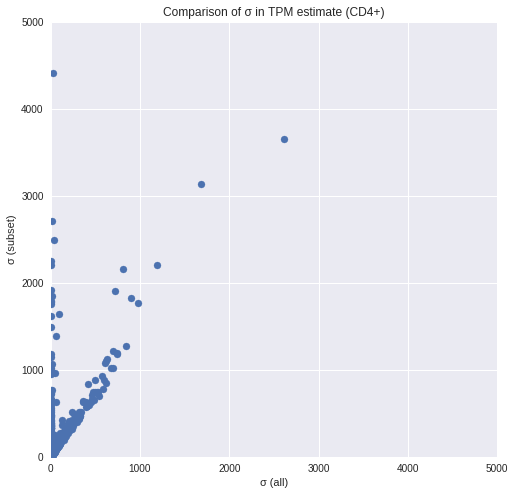

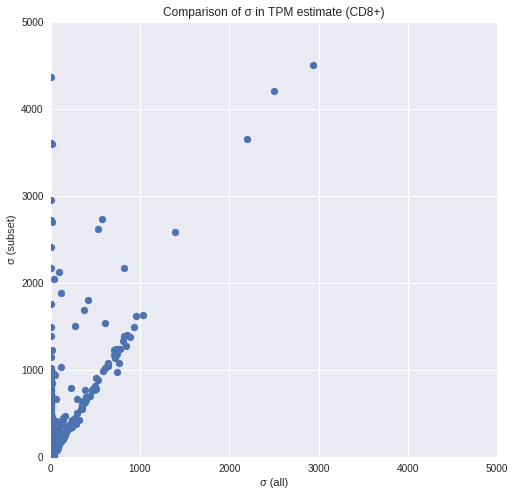

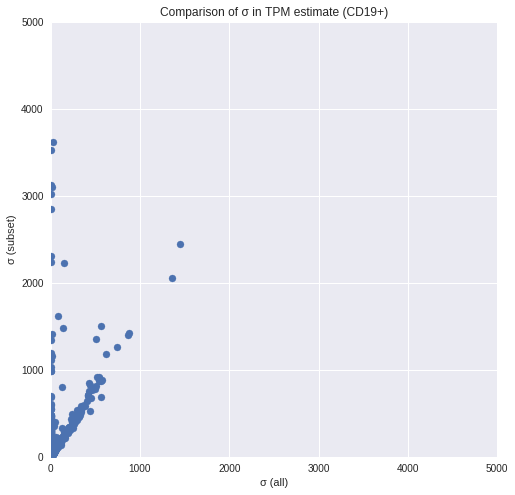

In [129]:
## Scatterplots

fig,ax = plt.subplots(figsize=(8,8))
pltCD4Var = ax.scatter(cd4allNoLog,cd4subNoLog)

plt.xlim(0,5000)
plt.ylim(0,5000)
ax.set_ylabel('σ (subset)')
ax.set_xlabel('σ (all)')
ax.set_title('Comparison of σ in TPM estimate (CD4+)')
plt.show()


fig,ax = plt.subplots(figsize=(8,8))
pltCD8Var = ax.scatter(cd8allNoLog,cd8subNoLog)

plt.xlim(0,5000)
plt.ylim(0,5000)
ax.set_ylabel('σ (subset)')
ax.set_xlabel('σ (all)')
ax.set_title('Comparison of σ in TPM estimate (CD8+)')
plt.show()


fig,ax = plt.subplots(figsize=(8,8))
pltCD18Var = ax.scatter(cd19allNoLog,cd19subNoLog)

plt.xlim(0,5000)
plt.ylim(0,5000)
ax.set_ylabel('σ (subset)')
ax.set_xlabel('σ (all)')
ax.set_title('Comparison of σ in TPM estimate (CD19+)')
plt.show()

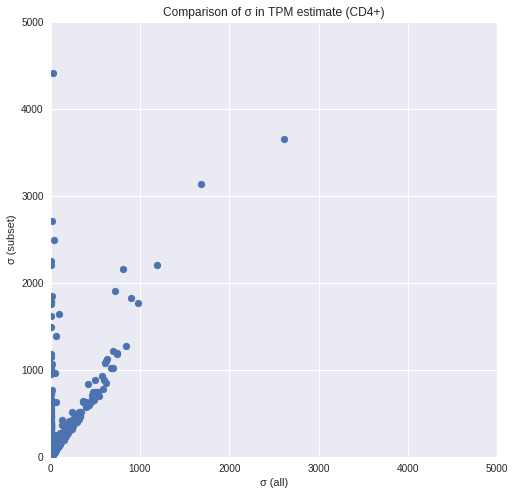

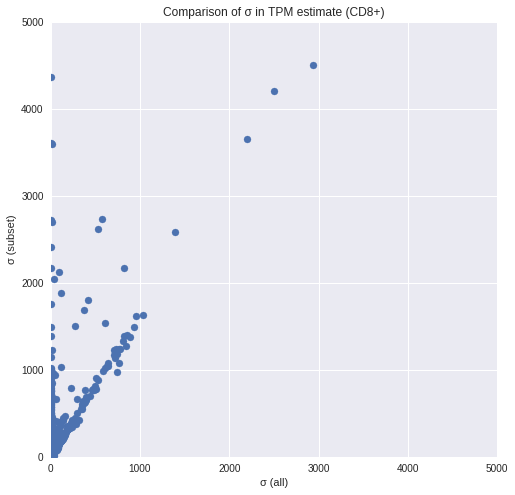

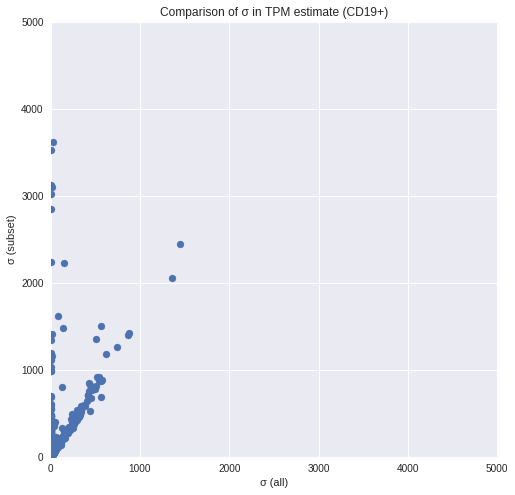

In [130]:
## Set up dataframes -- if var=0 for either then remove

cd4all2NoLog=[]
cd8all2NoLog=[]
cd19all2NoLog=[]
cd4sub2NoLog=[]
cd8sub2NoLog=[]
cd19sub2NoLog=[]

for i in range(0,len(xsVarCompareNoLog)):
    if xsVarCompareNoLog[i][1] > 0 and xsVarCompareNoLog[i][4] > 0:
        cd19all2NoLog.append(xsVarCompareNoLog[i][1])
        cd19sub2NoLog.append(xsVarCompareNoLog[i][4])
    if xsVarCompareNoLog[i][2] > 0 and xsVarCompareNoLog[i][5] > 0:
        cd4all2NoLog.append(xsVarCompareNoLog[i][2])
        cd4sub2NoLog.append(xsVarCompareNoLog[i][5])
    if xsVarCompareNoLog[i][3] > 0 and xsVarCompareNoLog[i][6] > 0:
        cd8all2NoLog.append(xsVarCompareNoLog[i][3])
        cd8sub2NoLog.append(xsVarCompareNoLog[i][6])

## Scatterplots

fig,ax = plt.subplots(figsize=(8,8))
pltCD4Var = ax.scatter(cd4all2NoLog,cd4sub2NoLog)

plt.xlim(0,5000)
plt.ylim(0,5000)
ax.set_ylabel('σ (subset)')
ax.set_xlabel('σ (all)')
ax.set_title('Comparison of σ in TPM estimate (CD4+)')
plt.show()


fig,ax = plt.subplots(figsize=(8,8))
pltCD8Var = ax.scatter(cd8all2NoLog,cd8sub2NoLog)

plt.xlim(0,5000)
plt.ylim(0,5000)
ax.set_ylabel('σ (subset)')
ax.set_xlabel('σ (all)')
ax.set_title('Comparison of σ in TPM estimate (CD8+)')
plt.show()


fig,ax = plt.subplots(figsize=(8,8))
pltCD18Var = ax.scatter(cd19all2NoLog,cd19sub2NoLog)

plt.xlim(0,5000)
plt.ylim(0,5000)
ax.set_ylabel('σ (subset)')
ax.set_xlabel('σ (all)')
ax.set_title('Comparison of σ in TPM estimate (CD19+)')
plt.show()

In [23]:
# Import data

mcLab=os.environ["MCLAB"]

allXSdata=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/hg19_aceview_all_transcripts_cv.csv',
                           delimiter=",", names=True,
                          dtype=[('transcript_id','|S64'),('cv_cd19','<f8'),('cv_cd4','<f8'),('cv_cd8','<f8'),
                                 ('flag_filter','<f8')])
# Index  Variable        Description
# 0      transcript_id   transcript ID
# 1      var_cd19        variance in CD19+
# 2      var_cd4         variance in CD4+
# 3      var_cd8         variance in CD8+
# 4      flag_filter     transcript is in filtered list

filtXSdata=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/hg19_aceview_75perc_apn5_transcripts_cv.csv',
                           delimiter=",", names=True,
                          dtype=[('transcript_id','|S64'),('cv_cd19','<f8'),('cv_cd4','<f8'),('cv_cd8','<f8')])


# Index  Variable        Description
# 0      transcript_id   transcript ID
# 1      var_cd19        variance in CD19+
# 2      var_cd4         variance in CD4+
# 3      var_cd8         variance in CD8+


In [24]:
## Set up various dataframes

# I want the following comparisons:
# Complete vs Filtered -- all possible transcripts in each (comparison 1)
# Complete vs Filtered -- all detected transcripts in each (comparison 2)
# Complete vs Filtered -- all common transcripts (comparison 3)
# Complete vs Filtered -- all common transcripts and detected  (comparison 4)

list1CD4all=[]
list1CD4filt=[]
list2CD4all=[]

list1CD8all=[]
list1CD8filt=[]
list2CD8all=[]

list1CD19all=[]
list1CD19filt=[]
list2CD19all=[]

## for all transcripts
for i in range(0,len(allXSdata)):
    if numpy.isnan(allXSdata[i][2]) == False and allXSdata[i][2] > 0:
        list1CD4all.append(allXSdata[i][2])
        if allXSdata[i][4] == 1:
            list2CD4all.append(allXSdata[i][2])

    if numpy.isnan(allXSdata[i][3]) == False and allXSdata[i][3] > 0:
        list1CD8all.append(allXSdata[i][3])
        if allXSdata[i][4] == 1:
            list2CD8all.append(allXSdata[i][3])

    if numpy.isnan(allXSdata[i][1]) == False and allXSdata[i][1] > 0:
        list1CD19all.append(allXSdata[i][1])
        if allXSdata[i][4] == 1:
            list2CD19all.append(allXSdata[i][1])
   


## for filtered transcripts
for i in range(0,len(filtXSdata)):
    if numpy.isnan(filtXSdata[i][2]) == False and filtXSdata[i][2] > 0:
        list1CD4filt.append(filtXSdata[i][2])
    if numpy.isnan(filtXSdata[i][3]) == False and filtXSdata[i][3] > 0:
        list1CD8filt.append(filtXSdata[i][3])
    if numpy.isnan(filtXSdata[i][1]) == False and filtXSdata[i][1] > 0:
        list1CD19filt.append(filtXSdata[i][1])

/usr/local/software/anaconda/4-3-1/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


<function matplotlib.pyplot.legend>

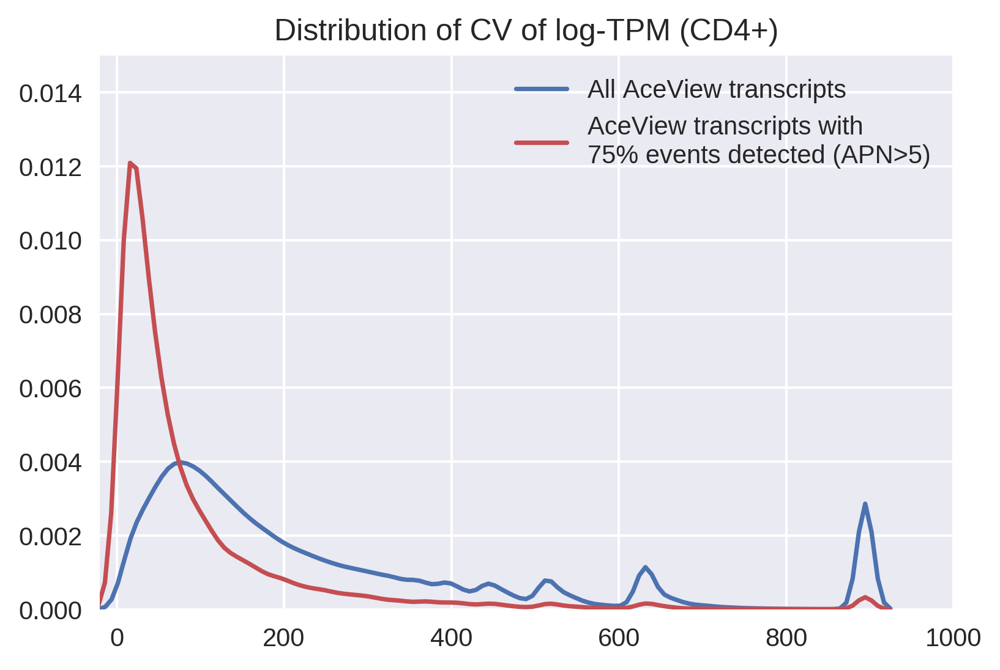

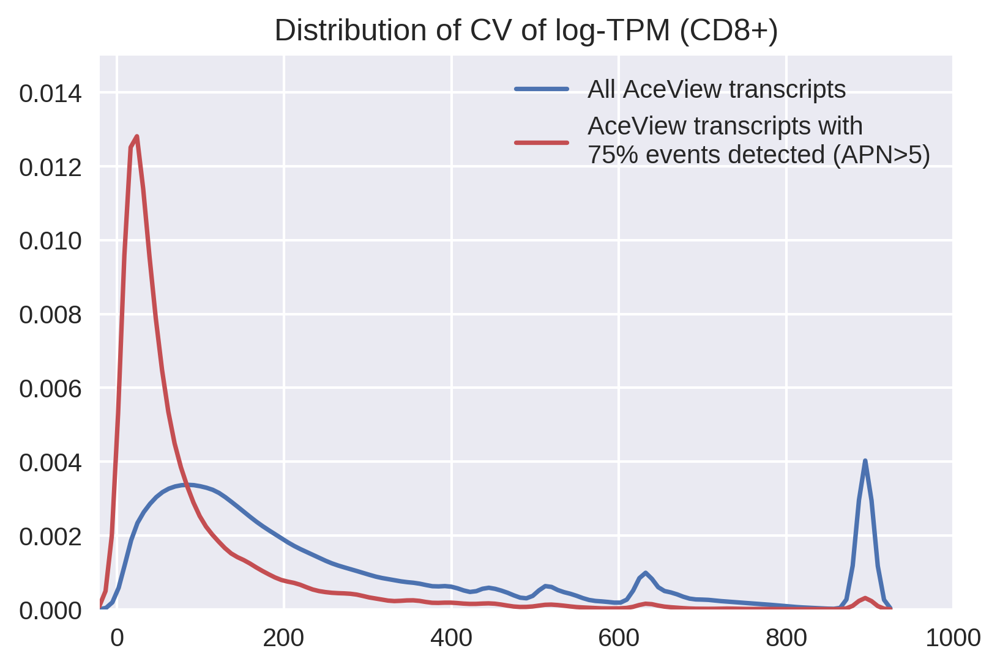

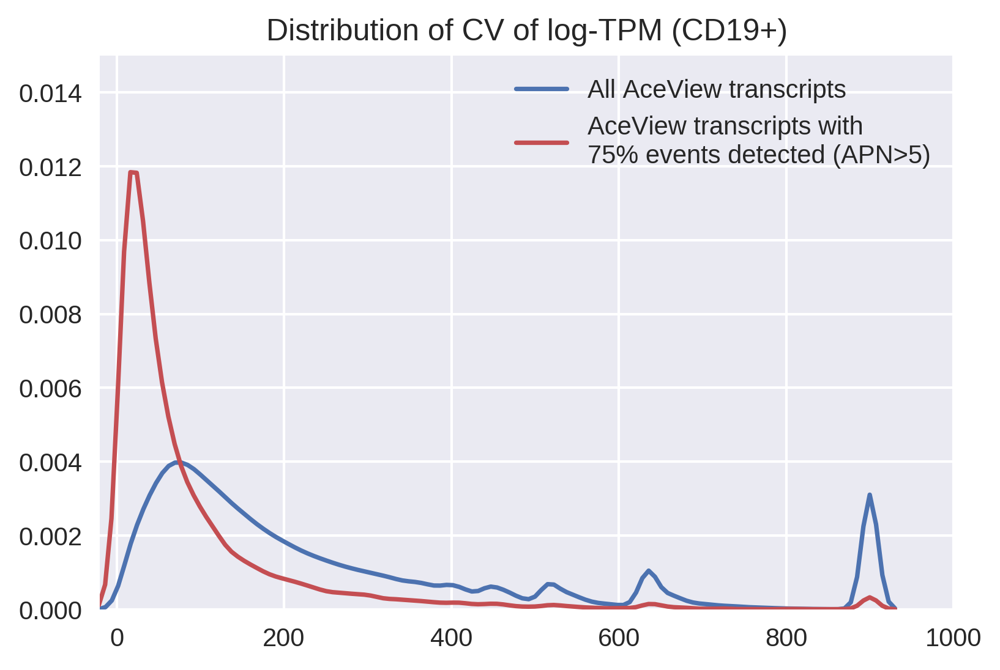

In [25]:
## Comparison 1 -- no detection or common-ness filtering

x1=numpy.asarray(list1CD4all)
y1=numpy.asarray(list1CD4filt)

plt.figure(figsize=(6,4), dpi=300)
seaborn.kdeplot(x1, bw=10, label="All AceView transcripts", color="b")
seaborn.kdeplot(y1, bw=10, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of CV of log-TPM (CD4+)")
plt.xlim(-20,1000)
plt.ylim(0,0.015)
plt.legend

x2=numpy.asarray(list1CD8all)
y2=numpy.asarray(list1CD8filt)

plt.figure(figsize=(6,4), dpi=300)
seaborn.kdeplot(x2, bw=10, label="All AceView transcripts", color="b")
seaborn.kdeplot(y2, bw=10, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of CV of log-TPM (CD8+)")
plt.xlim(-20,1000)
plt.ylim(0,0.015)
plt.legend

x3=numpy.asarray(list1CD19all)
y3=numpy.asarray(list1CD19filt)

plt.figure(figsize=(6,4), dpi=300)
seaborn.kdeplot(x3, bw=10, label="All AceView transcripts", color="b")
seaborn.kdeplot(y3, bw=10, label="AceView transcripts with\n75% events detected (APN>5)", color="r")
plt.title("Distribution of CV of log-TPM (CD19+)")
plt.xlim(-20,1000)
plt.ylim(0,0.015)
plt.legend


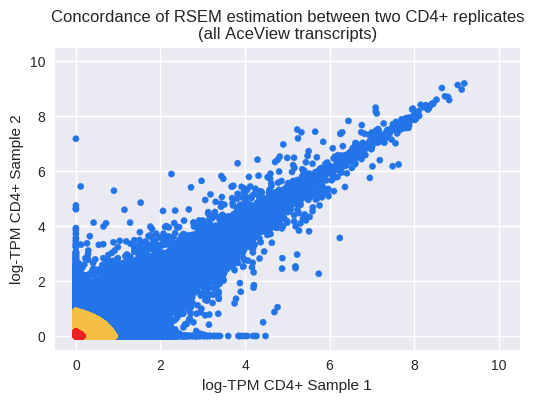

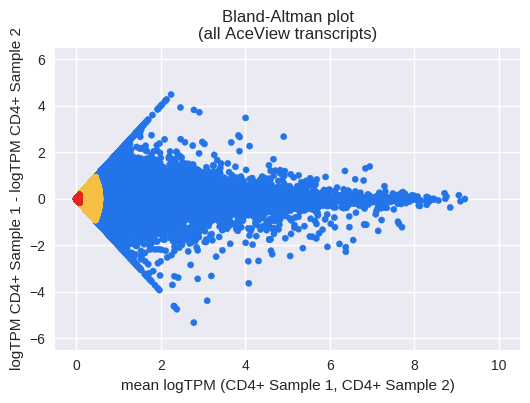

In [3]:
#import data

mcLab=os.environ["MCLAB"]

rsemData=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/rsem_t1d_concordance_example_all.csv', delimiter=",", names=True,
                        dtype=[('transcript_id','|S30'),('tpm_sample1','<f8'),('tpm_sample2','<f8'),
                               ('log_tpm_sample1','<f8'),('log_tpm_sample2','<f8'),('tpm_bin','<f8'),
                               ('mean_tpm','<f8'),('mean_log_tpm','<f8'),('diff_log_tpm','<f8')])


# Index   Variable               Description
# 0       transcript_id
# 1       tpm_sample1
# 2       tpm_sample2
# 3       log_tpm_sample1
# 4       log_tpm_sample2
# 5       tpm_bin
# 6       mean_tpm
# 7       mean_log_tpm
# 8       diff_log_tpm

#set up data
rep1=[]
rep2=[]
logRep1=[]
logRep2=[]
binColor=[]
meanRaw=[]
diffRaw=[]
meanLog=[]
diffLog=[]

for i in range(0,len(rsemData)):
    logRep1.append(rsemData[i][3])
    logRep2.append(rsemData[i][4])
    meanLog.append(rsemData[i][7])
    diffLog.append(rsemData[i][8])
    if rsemData[i][5] == 1:
        binColor.append('#e82222')
    elif rsemData[i][5] == 2:
        binColor.append('#f4bf42')
    elif rsemData[i][5] == 3:
        binColor.append('#2274e8')


# Plot

fig,ax = plt.subplots(figsize=(6,4), dpi=100)
pltCorr2 = ax.scatter(logRep1,logRep2, s=20, color=binColor)

plt.xlim(-0.5,10.5)
plt.ylim(-0.5,10.5)
#ax.set_xscale('log')
#ax.set_yscale('log')
ax.set_ylabel('log-TPM CD4+ Sample 2')
ax.set_xlabel('log-TPM CD4+ Sample 1') 
ax.set_title('Concordance of RSEM estimation between two CD4+ replicates\n(all AceView transcripts)')
plt.show()


# BA plots

fig,ax = plt.subplots(figsize=(6,4), dpi=100)
pltCorr2 = ax.scatter(meanLog,diffLog, s=20, color=binColor)
plt.xlim(-0.5,10.5)
plt.ylim(-6.5,6.5)
#ax.set_xscale('log')
#ax.set_yscale('log')
ax.set_ylabel('logTPM CD4+ Sample 1 - logTPM CD4+ Sample 2')
ax.set_xlabel('mean logTPM (CD4+ Sample 1, CD4+ Sample 2)') 
ax.set_title('Bland-Altman plot\n(all AceView transcripts)')
plt.show()

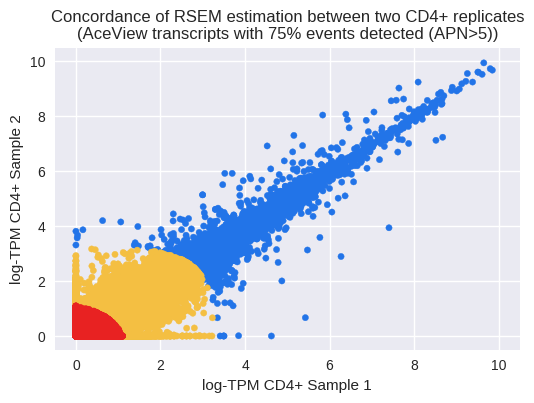

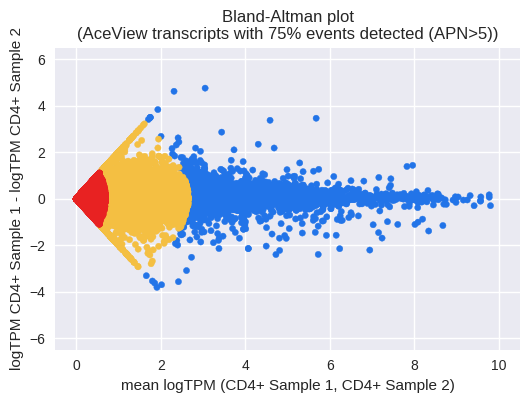

In [4]:
#import data

mcLab=os.environ["MCLAB"]

rsemData=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/rsem_t1d_concordance_example_reduced.csv', delimiter=",", names=True,
                        dtype=[('transcript_id','|S30'),('tpm_sample1','<f8'),('tpm_sample2','<f8'),
                               ('log_tpm_sample1','<f8'),('log_tpm_sample2','<f8'),('tpm_bin','<f8'),
                               ('mean_tpm','<f8'),('mean_log_tpm','<f8'),('diff_log_tpm','<f8')])


# Index   Variable               Description
# 0       transcript_id
# 1       tpm_sample1
# 2       tpm_sample2
# 3       log_tpm_sample1
# 4       log_tpm_sample2
# 5       tpm_bin
# 6       mean_tpm
# 7       mean_log_tpm
# 8       diff_log_tpm

#set up data
rep1=[]
rep2=[]
logRep1=[]
logRep2=[]
binColor=[]
meanRaw=[]
diffRaw=[]
meanLog=[]
diffLog=[]

for i in range(0,len(rsemData)):
    logRep1.append(rsemData[i][3])
    logRep2.append(rsemData[i][4])
    meanLog.append(rsemData[i][7])
    diffLog.append(rsemData[i][8])
    if rsemData[i][5] == 1:
        binColor.append('#e82222')
    elif rsemData[i][5] == 2:
        binColor.append('#f4bf42')
    elif rsemData[i][5] == 3:
        binColor.append('#2274e8')


# Plot

fig,ax = plt.subplots(figsize=(6,4), dpi=100)
pltCorr2 = ax.scatter(logRep1,logRep2, s=20, color=binColor)

plt.xlim(-0.5,10.5)
plt.ylim(-0.5,10.5)
#ax.set_xscale('log')
#ax.set_yscale('log')
ax.set_ylabel('log-TPM CD4+ Sample 2')
ax.set_xlabel('log-TPM CD4+ Sample 1') 
ax.set_title('Concordance of RSEM estimation between two CD4+ replicates\n(AceView transcripts with 75% events detected (APN>5))')
plt.show()


# BA plots

fig,ax = plt.subplots(figsize=(6,4), dpi=100)
pltCorr2 = ax.scatter(meanLog,diffLog, s=20, color=binColor)
plt.xlim(-0.5,10.5)
plt.ylim(-6.5,6.5)
#ax.set_xscale('log')
#ax.set_yscale('log')
ax.set_ylabel('logTPM CD4+ Sample 1 - logTPM CD4+ Sample 2')
ax.set_xlabel('mean logTPM (CD4+ Sample 1, CD4+ Sample 2)') 
ax.set_title('Bland-Altman plot\n(AceView transcripts with 75% events detected (APN>5))')
plt.show()

### Distribution of transcripts per gene at various levels of detection


In [5]:
#import data

mcLab=os.environ["MCLAB"]

## NSCs
dataNSC=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/event_analysis_t1d_xscripts_per_gene_perc_total_detected_nomulti.csv', delimiter=",", names=True,
                        dtype=[('gene_id','|S30'),('num_xscript_min_perc_on_100','<f8'),
                               ('num_xscript_min_perc_on_75','<f8'),('num_xscript_min_perc_on_50','<f8'),
                               ('num_xscript_min_perc_on_25','<f8'),('num_xscript_min_perc_on_0','<f8')])


# Index   Variable
#  0      gene_id
#  1      num_xscript_min_perc_on_100
#  2      num_xscript_min_perc_on_75
#  3      num_xscript_min_perc_on_50
#  4      num_xscript_min_perc_on_25
#  5      num_xscript_min_perc_on_0


In [7]:
### Set up bins

perc100xs1=0
perc100xs2=0
perc100xs3=0
perc100xs4=0
perc100xs5=0
perc100xs10=0
perc100xs20=0
perc100xs25=0

perc75xs1=0
perc75xs2=0
perc75xs3=0
perc75xs4=0
perc75xs5=0
perc75xs10=0
perc75xs20=0
perc75xs25=0

perc50xs1=0
perc50xs2=0
perc50xs3=0
perc50xs4=0
perc50xs5=0
perc50xs10=0
perc50xs20=0
perc50xs25=0

perc25xs1=0
perc25xs2=0
perc25xs3=0
perc25xs4=0
perc25xs5=0
perc25xs10=0
perc25xs20=0
perc25xs25=0

perc0xs1=0
perc0xs2=0
perc0xs3=0
perc0xs4=0
perc0xs5=0
perc0xs10=0
perc0xs20=0
perc0xs25=0

for gene in range(0,len(dataNSC)):
    if dataNSC[gene][1] == 1:
        perc100xs1=perc100xs1+1
    elif dataNSC[gene][1] == 2:
        perc100xs2=perc100xs2+1
    elif dataNSC[gene][1] == 3:
        perc100xs3=perc100xs3+1
    elif dataNSC[gene][1] == 4:
        perc100xs4=perc100xs4+1
    elif dataNSC[gene][1] == 5:
        perc100xs5=perc100xs5+1
    elif dataNSC[gene][1] >= 6 and dataNSC[gene][1] <= 10:
        perc100xs10=perc100xs10+1
    elif dataNSC[gene][1] >= 11 and dataNSC[gene][1] <= 20:
        perc100xs20=perc100xs20+1
    elif dataNSC[gene][1] > 25:
        perc100xs25=perc100xs25+1
    if dataNSC[gene][2] == 1:
        perc75xs1=perc75xs1+1
    elif dataNSC[gene][2] == 2:
        perc75xs2=perc75xs2+1
    elif dataNSC[gene][2] == 3:
        perc75xs3=perc75xs3+1
    elif dataNSC[gene][2] == 4:
        perc75xs4=perc75xs4+1
    elif dataNSC[gene][2] == 5:
        perc75xs5=perc75xs5+1
    elif dataNSC[gene][2] >= 6 and dataNSC[gene][2] <= 10:
        perc75xs10=perc75xs10+1
    elif dataNSC[gene][2] >= 11 and dataNSC[gene][2] <= 20:
        perc75xs20=perc75xs20+1
    elif dataNSC[gene][2] > 20:
        perc75xs25=perc75xs25+1
    if dataNSC[gene][3] == 1:
        perc50xs1=perc50xs1+1
    elif dataNSC[gene][3] == 2:
        perc50xs2=perc50xs2+1
    elif dataNSC[gene][3] == 3:
        perc50xs3=perc50xs3+1
    elif dataNSC[gene][3] == 4:
        perc50xs4=perc50xs4+1
    elif dataNSC[gene][3] == 5:
        perc50xs5=perc50xs5+1
    elif dataNSC[gene][3] >= 6 and dataNSC[gene][3] <= 10:
        perc50xs10=perc50xs10+1
    elif dataNSC[gene][3] >= 11 and dataNSC[gene][3] <= 20:
        perc50xs20=perc50xs20+1
    elif dataNSC[gene][3] > 20:
        perc50xs25=perc50xs25+1
    if dataNSC[gene][4] == 1:
        perc25xs1=perc25xs1+1
    elif dataNSC[gene][4] == 2:
        perc25xs2=perc25xs2+1
    elif dataNSC[gene][4] == 3:
        perc25xs3=perc25xs3+1
    elif dataNSC[gene][4] == 4:
        perc25xs4=perc25xs4+1
    elif dataNSC[gene][4] == 5:
        perc25xs5=perc25xs5+1
    elif dataNSC[gene][4] >= 6 and dataNSC[gene][4] <= 10:
        perc25xs10=perc25xs10+1
    elif dataNSC[gene][4] >= 11 and dataNSC[gene][4] <= 20:
        perc25xs20=perc25xs20+1
    elif dataNSC[gene][4] > 20:
        perc25xs25=perc25xs25+1
    if dataNSC[gene][5] == 1:
        perc0xs1=perc0xs1+1
    elif dataNSC[gene][5] == 2:
        perc0xs2=perc0xs2+1
    elif dataNSC[gene][5] == 3:
        perc0xs3=perc0xs3+1
    elif dataNSC[gene][5] == 4:
        perc0xs4=perc0xs4+1
    elif dataNSC[gene][5] == 5:
        perc0xs5=perc0xs5+1
    elif dataNSC[gene][5] >= 6 and dataNSC[gene][5] <= 10:
        perc0xs10=perc0xs10+1
    elif dataNSC[gene][5] >= 11 and dataNSC[gene][5] <= 20:
        perc0xs20=perc0xs20+1
    elif dataNSC[gene][5] > 20:
        perc0xs25=perc0xs25+1

perc100xs=[perc100xs1,perc100xs2,perc100xs3,perc100xs4,perc100xs5,perc100xs10,perc100xs20,perc100xs25]
perc75xs=[perc75xs1,perc75xs2,perc75xs3,perc75xs4,perc75xs5,perc75xs10,perc75xs20,perc75xs25]
perc50xs=[perc50xs1,perc50xs2,perc50xs3,perc50xs4,perc50xs5,perc50xs10,perc50xs20,perc50xs25]
perc25xs=[perc25xs1,perc25xs2,perc25xs3,perc25xs4,perc25xs5,perc25xs10,perc25xs20,perc25xs25]
perc0xs=[perc0xs1,perc0xs2,perc0xs3,perc0xs4,perc0xs5,perc0xs10,perc0xs20,perc0xs25]

print(perc100xs)
print(perc75xs)
print(perc50xs)
print(perc25xs)
print(perc0xs)

[3155, 301, 144, 68, 49, 65, 6, 0]
[2819, 387, 322, 269, 276, 971, 644, 118]
[2735, 389, 289, 271, 267, 1227, 1105, 272]
[3018, 423, 314, 286, 288, 1325, 1261, 354]
[3052, 464, 340, 319, 311, 1455, 1351, 382]


## Distribution of transcripts by proportion detected

In [9]:
## Probable transcripts in bins
xsProb=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/event_analysis_t1d_transcripts_by_perc_unique_detected_nomulti.csv', delimiter=",", names=True,
                        dtype=[('transcript_id','|S150'),('num_total_features','<f8'),('num_features_dtct_cd4','<f8'),
                               ('num_features_dtct_cd8','<f8'),('num_features_dtct_cd19','<f8'),
                               ('num_total_uniq_features','<f8'),('num_uniq_features_dtct_cd4','<f8'),
                               ('num_uniq_features_dtct_cd8','<f8'),('num_uniq_features_dtct_cd19','<f8'),
                               ('perc_features_dtct_cd4','<f8'),('perc_features_dtct_cd8','<f8'),
                               ('perc_features_dtct_cd19','<f8'),('perc_unique_features_dtct_cd4','<f8'),
                               ('perc_unique_features_dtct_cd8','<f8'),('perc_unique_features_dtct_cd19','<f8'),
                               ('flag_xscript_has_features','<f8'),('flag_xscript_has_dtct_features','<f8'),
                               ('flag_xscript_has_unique','<f8'),('flag_xscript_has_unique_dtct','<f8')])


# Index  Variable 
# 0      transcript_id
# 1      num_total_features
# 2      num_features_dtct_cd4
# 3      num_features_dtct_cd8
# 4      num_features_dtct_cd19
# 5      num_total_uniq_features
# 6      num_uniq_features_dtct_cd4
# 7      num_uniq_features_dtct_cd8
# 8      num_uniq_features_dtct_cd19
# 9      perc_features_dtct_cd4
# 10     perc_features_dtct_cd8
# 11     perc_features_dtct_cd19
# 12     perc_unique_features_dtct_cd4
# 13     perc_unique_features_dtct_cd8
# 14     perc_unique_features_dtct_cd19
# 15     flag_xscript_has_features
# 16     flag_xscript_has_dtct_features
# 17     flag_xscript_has_unique
# 18     flag_xscript_has_unique_dtct


In [10]:
### Plot of expressed transcripts, # with any detected, # no unique detected.
### I want to look at the % of total detected features per transcript

        
### Number of expressed transcripts in each %dtct  bin -- CD4+
xsCD4TotalPercBin1=0
xsCD4TotalPercBin2=0
xsCD4TotalPercBin3=0
xsCD4TotalPercBin4=0
xsCD4TotalPercBin5=0
xsCD4TotalPercBin6=0
xsCD4TotalPercBinOops=0

for xs in range(0,len(xsProb)):
    if xsProb[xs][2] > 0:
        if xsProb[xs][9] == 0:
            xsCD4TotalPercBin1=xsCD4TotalPercBin1+1
        elif xsProb[xs][9] < 0.25:
            xsCD4TotalPercBin2=xsCD4TotalPercBin2+1
        elif xsProb[xs][9] < 0.5:
            xsCD4TotalPercBin3=xsCD4TotalPercBin3+1
        elif xsProb[xs][9] < 0.75:
            xsCD4TotalPercBin4=xsCD4TotalPercBin4+1
        elif xsProb[xs][9] < 1:
            xsCD4TotalPercBin5=xsCD4TotalPercBin5+1
        elif xsProb[xs][9] == 1:
            xsCD4TotalPercBin6=xsCD4TotalPercBin6+1
        else:
            xsCD4TotalPercBinOops=xsCD4TotalPercBinOops+1

        
print(xsCD4TotalPercBin1)
print(xsCD4TotalPercBin2)
print(xsCD4TotalPercBin3)
print(xsCD4TotalPercBin4)
print(xsCD4TotalPercBin5)
print(xsCD4TotalPercBin6)
print(xsCD4TotalPercBinOops)



### Plot density of expressed xscripts by proportion of detected total features
xsCD4PercDtctDens=[]
for xs in range(0,len(xsProb)):
    if xsProb[xs][2] > 0:
        xsCD4PercDtctDens.append(xsProb[xs][9])

0
3595
6209
12566
18627
4197
0


In [11]:
### Plot of expressed transcripts, # with any detected, # no unique detected.
### I want to look at the % of total detected features per transcript

        
### Number of expressed transcripts in each %dtct  bin -- CD8+
xsCD8TotalPercBin1=0
xsCD8TotalPercBin2=0
xsCD8TotalPercBin3=0
xsCD8TotalPercBin4=0
xsCD8TotalPercBin5=0
xsCD8TotalPercBin6=0
xsCD8TotalPercBinOops=0

for xs in range(0,len(xsProb)):
    if xsProb[xs][3] > 0:
        if xsProb[xs][10] == 0:
            xsCD8TotalPercBin1=xsCD8TotalPercBin1+1
        elif xsProb[xs][10] < 0.25:
            xsCD8TotalPercBin2=xsCD8TotalPercBin2+1
        elif xsProb[xs][10] < 0.5:
            xsCD8TotalPercBin3=xsCD8TotalPercBin3+1
        elif xsProb[xs][10] < 0.75:
            xsCD8TotalPercBin4=xsCD8TotalPercBin4+1
        elif xsProb[xs][10] < 1:
            xsCD8TotalPercBin5=xsCD8TotalPercBin5+1
        elif xsProb[xs][10] == 1:
            xsCD8TotalPercBin6=xsCD8TotalPercBin6+1
        else:
            xsCD8TotalPercBinOops=xsCD8TotalPercBinOops+1

        
print(xsCD8TotalPercBin1)
print(xsCD8TotalPercBin2)
print(xsCD8TotalPercBin3)
print(xsCD8TotalPercBin4)
print(xsCD8TotalPercBin5)
print(xsCD8TotalPercBin6)
print(xsCD8TotalPercBinOops)



### Plot density of expressed xscripts by proportion of detected total features
xsCD8PercDtctDens=[]
for xs in range(0,len(xsProb)):
    if xsProb[xs][3] > 0:
        xsCD8PercDtctDens.append(xsProb[xs][10])

0
3555
6058
12586
19231
4369
0


In [12]:
### Plot of expressed transcripts, # with any detected, # no unique detected.
### I want to look at the % of total detected features per transcript

        
### Number of expressed transcripts in each %dtct  bin -- CD19+
xsCD19TotalPercBin1=0
xsCD19TotalPercBin2=0
xsCD19TotalPercBin3=0
xsCD19TotalPercBin4=0
xsCD19TotalPercBin5=0
xsCD19TotalPercBin6=0
xsCD19TotalPercBinOops=0

for xs in range(0,len(xsProb)):
    if xsProb[xs][4] > 0:
        if xsProb[xs][11] == 0:
            xsCD19TotalPercBin1=xsCD19TotalPercBin1+1
        elif xsProb[xs][11] < 0.25:
            xsCD19TotalPercBin2=xsCD19TotalPercBin2+1
        elif xsProb[xs][11] < 0.5:
            xsCD19TotalPercBin3=xsCD19TotalPercBin3+1
        elif xsProb[xs][11] < 0.75:
            xsCD19TotalPercBin4=xsCD19TotalPercBin4+1
        elif xsProb[xs][11] < 1:
            xsCD19TotalPercBin5=xsCD19TotalPercBin5+1
        elif xsProb[xs][11] == 1:
            xsCD19TotalPercBin6=xsCD19TotalPercBin6+1
        else:
            xsCD19TotalPercBinOops=xsCD19TotalPercBinOops+1

        
print(xsCD19TotalPercBin1)
print(xsCD19TotalPercBin2)
print(xsCD19TotalPercBin3)
print(xsCD19TotalPercBin4)
print(xsCD19TotalPercBin5)
print(xsCD19TotalPercBin6)
print(xsCD19TotalPercBinOops)



### Plot density of expressed xscripts by proportion of detected total features
xsCD19PercDtctDens=[]
for xs in range(0,len(xsProb)):
    if xsProb[xs][4] > 0:
        xsCD19PercDtctDens.append(xsProb[xs][11])

0
3771
6162
12516
19089
4089
0


/usr/local/software/anaconda/4-3-1/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


<function matplotlib.pyplot.legend>

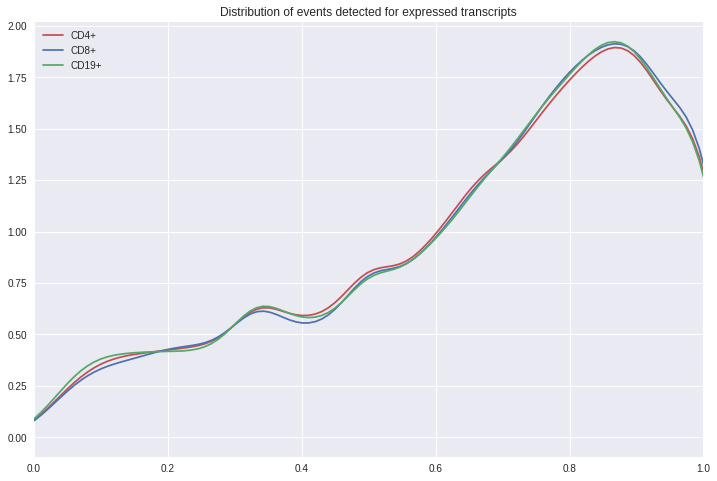

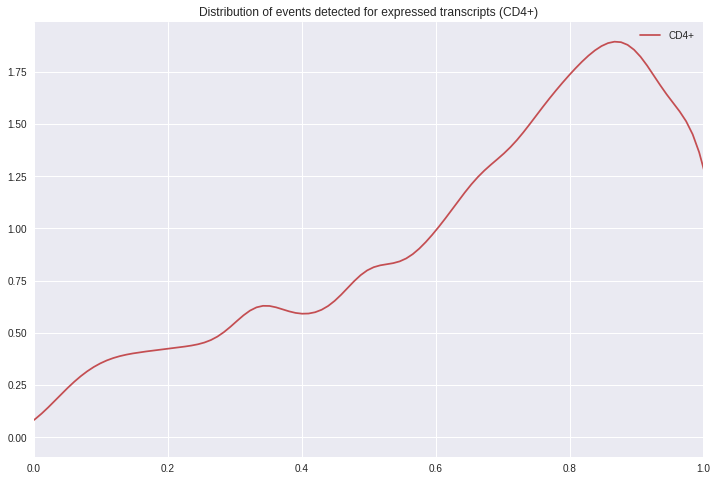

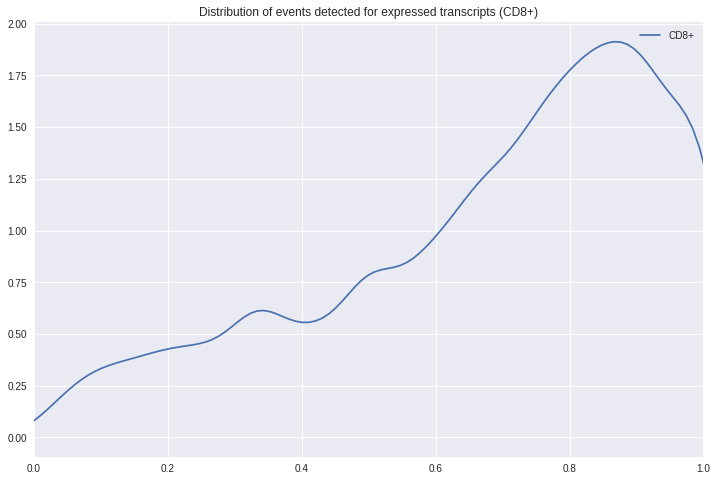

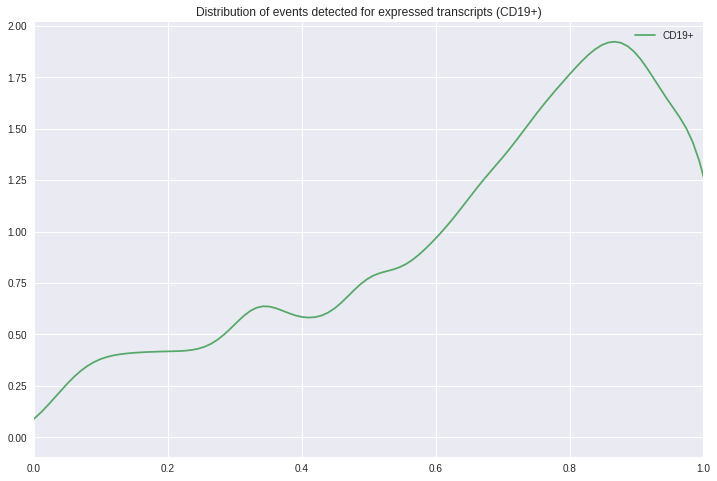

In [32]:
## Density plot for detected unique features -- plot separately then together

x1=numpy.asarray(xsCD4PercDtctDens)
y1=numpy.asarray(xsCD8PercDtctDens)
z1=numpy.asarray(xsCD19PercDtctDens)

plt.figure(figsize=(12,8))
seaborn.kdeplot(x1, bw=0.04, label="CD4+", color="r")
seaborn.kdeplot(y1, bw=0.04, label="CD8+", color="b")
seaborn.kdeplot(z1, bw=0.04, label="CD19+", color="g")
plt.xlim(0,1)
plt.title("Distribution of events detected for expressed transcripts")
plt.legend


plt.figure(figsize=(12,8))
seaborn.kdeplot(x1, bw=0.04, label="CD4+", color="r")
#seaborn.kdeplot(y1, bw=0.5, label="CD8+", color="b")
#seaborn.kdeplot(z1, bw=0.5, label="CD19+", color="g")
plt.xlim(0,1)
plt.title("Distribution of events detected for expressed transcripts (CD4+)")
plt.legend

plt.figure(figsize=(12,8))
#seaborn.kdeplot(x1, bw=0.5, label="CD4+", color="r")
seaborn.kdeplot(y1, bw=0.04, label="CD8+", color="b")
#seaborn.kdeplot(z1, bw=0.5, label="CD19+", color="g")
plt.xlim(0,1)
plt.title("Distribution of events detected for expressed transcripts (CD8+)")
plt.legend

plt.figure(figsize=(12,8))
#seaborn.kdeplot(x1, bw=0.5, label="CD4+", color="r")
#seaborn.kdeplot(y1, bw=0.5, label="CD8+", color="b")
seaborn.kdeplot(z1, bw=0.04, label="CD19+", color="g")
plt.xlim(0,1)
plt.title("Distribution of events detected for expressed transcripts (CD19+)")
plt.legend

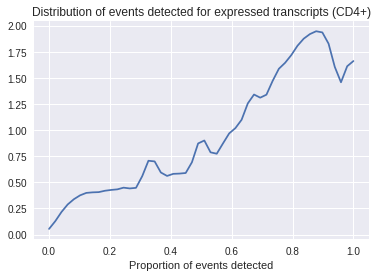

In [21]:
import scipy
from scipy.stats import gaussian_kde

## Density plot for detected unique features

num_bins = numpy.linspace(0,1,50)
densUniq = gaussian_kde(xsCD4PercDtctDens)
densUniq.covariance_factor = lambda : .1
densUniq._compute_covariance()
plt.plot(num_bins,densUniq(num_bins))
plt.xlabel('Proportion of events detected')
densityTitle='Distribution of events detected for expressed transcripts (CD4+)'
plt.title(densityTitle)

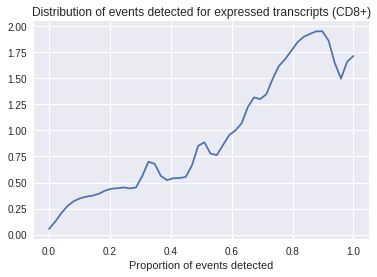

In [25]:
import scipy
from scipy.stats import gaussian_kde

## Density plot for detected unique features

num_bins = numpy.linspace(0,1,50)
densUniq = gaussian_kde(xsCD8PercDtctDens)
densUniq.covariance_factor = lambda : .1
densUniq._compute_covariance()
plt.plot(num_bins,densUniq(num_bins))
plt.xlabel('Proportion of events detected')
densityTitle='Distribution of events detected for expressed transcripts (CD8+)'
plt.title(densityTitle)

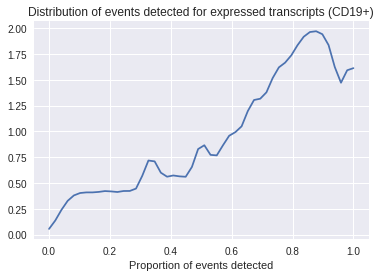

In [26]:
import scipy
from scipy.stats import gaussian_kde

## Density plot for detected unique features

num_bins = numpy.linspace(0,1,50)
densUniq = gaussian_kde(xsCD19PercDtctDens)
densUniq.covariance_factor = lambda : .1
densUniq._compute_covariance()
plt.plot(num_bins,densUniq(num_bins))
plt.xlabel('Proportion of events detected')
densityTitle='Distribution of events detected for expressed transcripts (CD19+)'
plt.title(densityTitle)

In [35]:
### Number of expressed transcripts in each %uniq bin -- CD4+
xsUniqPercBin1=0
xsUniqPercBin2=0
xsUniqPercBin3=0
xsUniqPercBin4=0
xsUniqPercBin5=0
xsUniqPercBin6=0
xsUniqPercBin7=0
xsUniqPercBinOops=0

for xs in range(0,len(xsProb)):
    if xsProb[xs][9] > 0 and numpy.isnan(xsProb[xs][9]) == False:
        if numpy.isnan(xsProb[xs][12]) == True:
            xsUniqPercBin1=xsUniqPercBin1+1
        elif xsProb[xs][12] == 0:
            xsUniqPercBin2=xsUniqPercBin2+1
        elif xsProb[xs][12] < 0.25:
            xsUniqPercBin3=xsUniqPercBin3+1
        elif xsProb[xs][12] < 0.5:
            xsUniqPercBin4=xsUniqPercBin4+1
        elif xsProb[xs][12] < 0.75:
            xsUniqPercBin5=xsUniqPercBin5+1
        elif xsProb[xs][12] < 1:
            xsUniqPercBin6=xsUniqPercBin6+1
        elif xsProb[xs][12] == 1:
            xsUniqPercBin7=xsUniqPercBin7+1
        else:
            xsUniqPercBinOops=xsUniqPercBinOops+1

        
print(str(xsUniqPercBin1) + " no unique")
print(str(xsUniqPercBin2) + " 0%")
print(str(xsUniqPercBin3) + " 0-25%")
print(str(xsUniqPercBin4) + " 25-50%")
print(str(xsUniqPercBin5) + " 50-75%")
print(str(xsUniqPercBin6) + " 75-100%" )
print(str(xsUniqPercBin7) +  " 100%")
print(str(xsUniqPercBinOops) + " oops")



# Index  Variable 
# 0      transcript_id
# 1      num_total_features
# 2      num_features_dtct_cd4
# 3      num_features_dtct_cd8
# 4      num_features_dtct_cd19
# 5      num_total_uniq_features
# 6      num_uniq_features_dtct_cd4
# 7      num_uniq_features_dtct_cd8
# 8      num_uniq_features_dtct_cd19
# 9      perc_features_dtct_cd4
# 10     perc_features_dtct_cd8
# 11     perc_features_dtct_cd19
# 12     perc_unique_features_dtct_cd4
# 13     perc_unique_features_dtct_cd8
# 14     perc_unique_features_dtct_cd19
# 15     flag_xscript_has_features
# 16     flag_xscript_has_dtct_features
# 17     flag_xscript_has_unique
# 18     flag_xscript_has_unique_dtct

8326 no unique
28882 0%
272 0-25%
1074 25-50%
1986 50-75%
229 75-100%
4425 100%
0 oops


In [36]:
### Number of expressed transcripts in each %uniq bin -- CD8+
xsUniqPercBin1=0
xsUniqPercBin2=0
xsUniqPercBin3=0
xsUniqPercBin4=0
xsUniqPercBin5=0
xsUniqPercBin6=0
xsUniqPercBin7=0
xsUniqPercBinOops=0

for xs in range(0,len(xsProb)):
    if xsProb[xs][10] > 0 and numpy.isnan(xsProb[xs][10]) == False:
        if numpy.isnan(xsProb[xs][13]) == True:
            xsUniqPercBin1=xsUniqPercBin1+1
        elif xsProb[xs][13] == 0:
            xsUniqPercBin2=xsUniqPercBin2+1
        elif xsProb[xs][13] < 0.25:
            xsUniqPercBin3=xsUniqPercBin3+1
        elif xsProb[xs][13] < 0.5:
            xsUniqPercBin4=xsUniqPercBin4+1
        elif xsProb[xs][13] < 0.75:
            xsUniqPercBin5=xsUniqPercBin5+1
        elif xsProb[xs][13] < 1:
            xsUniqPercBin6=xsUniqPercBin6+1
        elif xsProb[xs][13] == 1:
            xsUniqPercBin7=xsUniqPercBin7+1
        else:
            xsUniqPercBinOops=xsUniqPercBinOops+1

        
print(str(xsUniqPercBin1) + " no unique")
print(str(xsUniqPercBin2) + " 0%")
print(str(xsUniqPercBin3) + " 0-25%")
print(str(xsUniqPercBin4) + " 25-50%")
print(str(xsUniqPercBin5) + " 50-75%")
print(str(xsUniqPercBin6) + " 75-100%" )
print(str(xsUniqPercBin7) +  " 100%")
print(str(xsUniqPercBinOops) + " oops")



# Index  Variable 
# 0      transcript_id
# 1      num_total_features
# 2      num_features_dtct_cd4
# 3      num_features_dtct_cd8
# 4      num_features_dtct_cd19
# 5      num_total_uniq_features
# 6      num_uniq_features_dtct_cd4
# 7      num_uniq_features_dtct_cd8
# 8      num_uniq_features_dtct_cd19
# 9      perc_features_dtct_cd4
# 10     perc_features_dtct_cd8
# 11     perc_features_dtct_cd19
# 12     perc_unique_features_dtct_cd4
# 13     perc_unique_features_dtct_cd8
# 14     perc_unique_features_dtct_cd19
# 15     flag_xscript_has_features
# 16     flag_xscript_has_dtct_features
# 17     flag_xscript_has_unique
# 18     flag_xscript_has_unique_dtct

8428 no unique
29100 0%
268 0-25%
1103 25-50%
2053 50-75%
232 75-100%
4615 100%
0 oops


In [37]:
### Number of expressed transcripts in each %uniq bin -- CD19+
xsUniqPercBin1=0
xsUniqPercBin2=0
xsUniqPercBin3=0
xsUniqPercBin4=0
xsUniqPercBin5=0
xsUniqPercBin6=0
xsUniqPercBin7=0
xsUniqPercBinOops=0

for xs in range(0,len(xsProb)):
    if xsProb[xs][11] > 0 and numpy.isnan(xsProb[xs][11]) == False:
        if numpy.isnan(xsProb[xs][14]) == True:
            xsUniqPercBin1=xsUniqPercBin1+1
        elif xsProb[xs][14] == 0:
            xsUniqPercBin2=xsUniqPercBin2+1
        elif xsProb[xs][14] < 0.25:
            xsUniqPercBin3=xsUniqPercBin3+1
        elif xsProb[xs][14] < 0.5:
            xsUniqPercBin4=xsUniqPercBin4+1
        elif xsProb[xs][14] < 0.75:
            xsUniqPercBin5=xsUniqPercBin5+1
        elif xsProb[xs][14] < 1:
            xsUniqPercBin6=xsUniqPercBin6+1
        elif xsProb[xs][14] == 1:
            xsUniqPercBin7=xsUniqPercBin7+1
        else:
            xsUniqPercBinOops=xsUniqPercBinOops+1

        
print(str(xsUniqPercBin1) + " no unique")
print(str(xsUniqPercBin2) + " 0%")
print(str(xsUniqPercBin3) + " 0-25%")
print(str(xsUniqPercBin4) + " 25-50%")
print(str(xsUniqPercBin5) + " 50-75%")
print(str(xsUniqPercBin6) + " 75-100%" )
print(str(xsUniqPercBin7) +  " 100%")
print(str(xsUniqPercBinOops) + " oops")



# Index  Variable 
# 0      transcript_id
# 1      num_total_features
# 2      num_features_dtct_cd4
# 3      num_features_dtct_cd8
# 4      num_features_dtct_cd19
# 5      num_total_uniq_features
# 6      num_uniq_features_dtct_cd4
# 7      num_uniq_features_dtct_cd8
# 8      num_uniq_features_dtct_cd19
# 9      perc_features_dtct_cd4
# 10     perc_features_dtct_cd8
# 11     perc_features_dtct_cd19
# 12     perc_unique_features_dtct_cd4
# 13     perc_unique_features_dtct_cd8
# 14     perc_unique_features_dtct_cd19
# 15     flag_xscript_has_features
# 16     flag_xscript_has_dtct_features
# 17     flag_xscript_has_unique
# 18     flag_xscript_has_unique_dtct

8475 no unique
29396 0%
249 0-25%
1067 25-50%
1883 50-75%
232 75-100%
4325 100%
0 oops


## Making a heatmap table for IKZF3 transcripts


In [84]:
# import data -- mean TPM


## Probable transcripts in bins
ikMeans=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/IKZF3_mean_tpm_by_cell_transcript.csv', delimiter=",", names=True,
                        dtype=[('transcript_id','|S150'),('varname','|S150'),('CD19','<f8'),
                               ('CD4','<f8'),('CD8','<f8')])

# Index  Variable 
# 0      transcript_id
# 1      _NAME_
# 2      CD19
# 3      CD4
# 4      CD8

xsList=[]
tpmCD4=[]
tpmCD8=[]
tpmCD19=[]

for i in range(0,len(ikMeans)):
    xsList.append(ikMeans[i][0])
    tpmCD4.append(ikMeans[i][3])
    tpmCD8.append(ikMeans[i][4])
    tpmCD19.append(ikMeans[i][2])

tpmAll=[tpmCD4,tpmCD8,tpmCD19]



In [85]:
df = pandas.DataFrame(numpy.random.randn(10, 8), columns=list('abcdefgh'))
df2 = pandas.DataFrame(tpmAll)
df3 = df2.transpose()
df3.columns=['CD4','CD8','CD19']

In [86]:
print(df3)

        CD4       CD8      CD19
0  2.771213  3.156841  3.232550
1  2.096759  2.281157  1.711682
2  1.468220  1.462416  0.506818
3  3.056769  3.293306  2.190218


        CD4       CD8      CD19
0  0.839761  0.956618  0.979561
1  0.635382  0.691260  0.518692
2  0.444915  0.443156  0.153581
3  0.926294  0.997971  0.663702


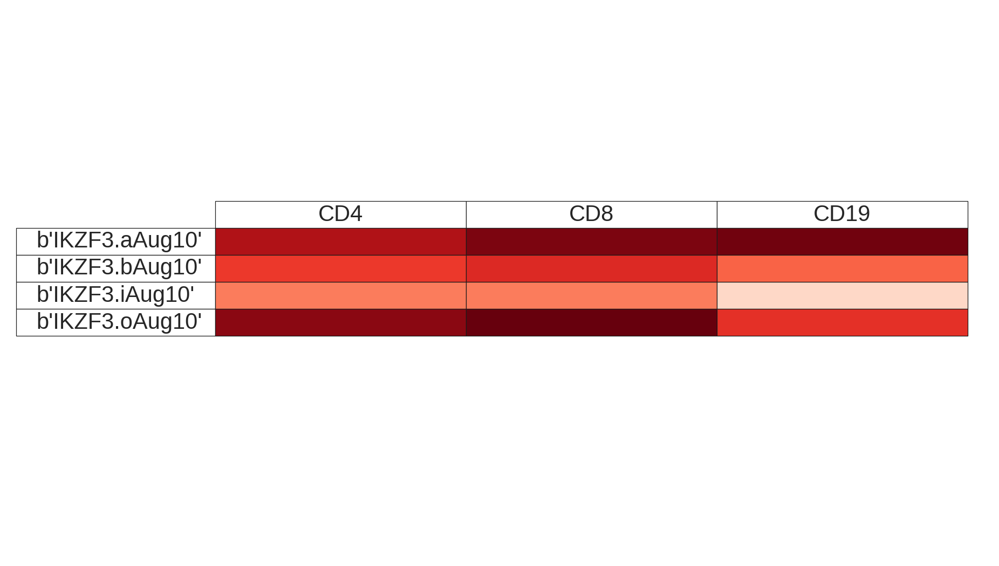

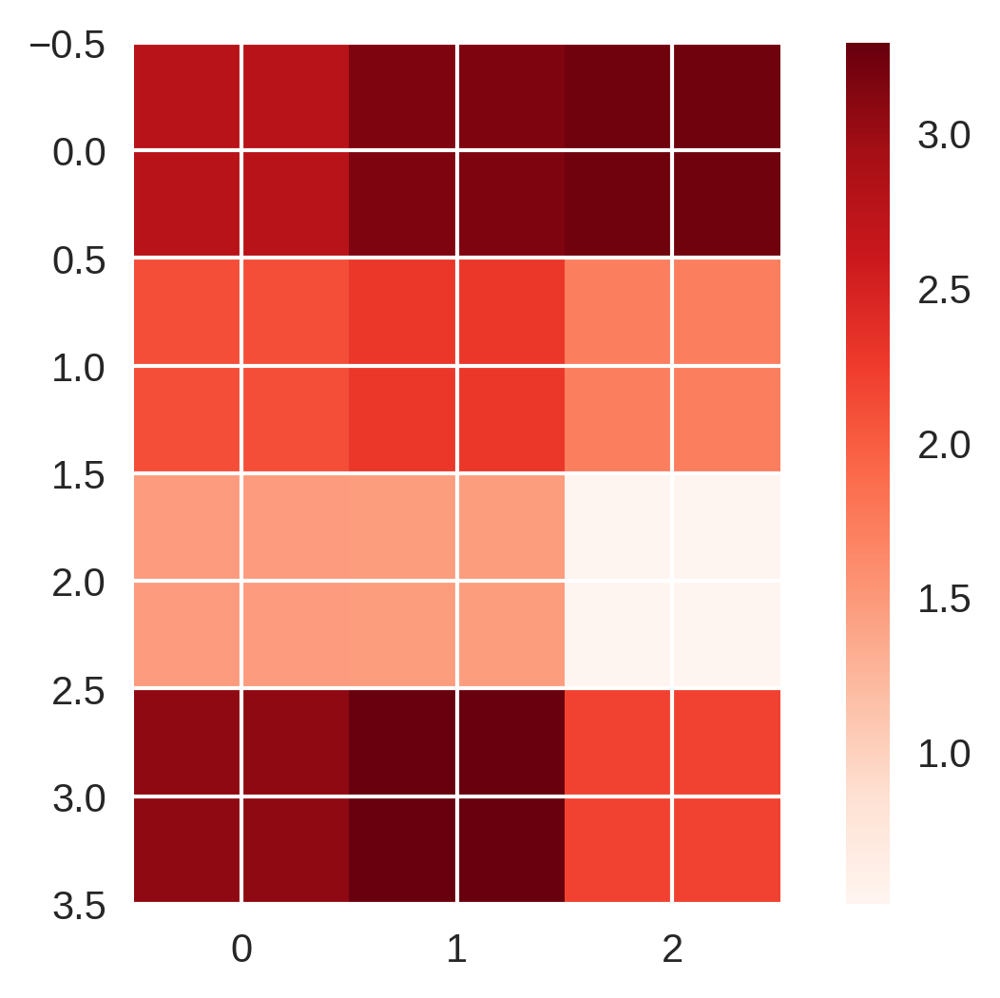

In [90]:
## Make fancy heatmap table
vals = numpy.around(df3.values, 3)

#Normalize data to [0, 1] range for color mapping below
normal = (df3 - 0) / (3.3 - 0)

print(normal)

fig = plt.figure(figsize=(6,4),dpi=300)
ax = fig.add_subplot(111)
ax.axis('off')
the_table=ax.table(rowLabels=xsList, colLabels=df3.columns, loc='center', cellColours=plt.cm.Reds(normal),animated=True)
plt.show()

fig = plt.figure(figsize=(6,4),dpi=300)
plt.imshow(df3, origin="upper", cmap='Reds')
plt.colorbar()
plt.show()



In [91]:
# import data -- subject TPM


## Probable transcripts in bins
ikBySubj=numpy.genfromtxt(mcLab + '/event_analysis/analysis_output/IKZF3_tpm_by_subject_cell_transcript.csv', delimiter=",", names=True,
                        dtype=[('subject_id','|S150'),('_NAME_','|S150'),('CD19_aAug10','<f8'),('CD19_bAug10','<f8'),
                               ('CD19_iAug10','<f8'),('CD19_oAug10','<f8'),('CD4_aAug10','<f8'),('CD4_bAug10','<f8'),
                               ('CD4_iAug10','<f8'),('CD4_oAug10','<f8'),('CD8_aAug10','<f8'),('CD8_bAug10','<f8'),
                               ('CD8_iAug10','<f8'),('CD8_oAug10','<f8')])






# Index  Variable 
# 0      subject_id
# 1      _NAME_
# 2      CD19_aAug10
# 3      CD19_bAug10
# 4      CD19_iAug10
# 5      CD19_oAug10
# 6      CD4_aAug10
# 7      CD4_bAug10
# 8      CD4_iAug10
# 9      CD4_oAug10
# 10      CD8_aAug10
# 11      CD8_bAug10
# 12      CD8_iAug10
# 13      CD8_oAug10



xsList=[]
tpmCD4a=[]
tpmCD4b=[]
tpmCD4i=[]
tpmCD4o=[]

tpmCD8a=[]
tpmCD8b=[]
tpmCD8i=[]
tpmCD8o=[]

tpmCD19a=[]
tpmCD19b=[]
tpmCD19i=[]
tpmCD19o=[]

for i in range(0,len(ikBySubj)):
    xsList.append(ikBySubj[i][0])
    tpmCD4a.append(ikBySubj[i][6])
    tpmCD4b.append(ikBySubj[i][7])
    tpmCD4i.append(ikBySubj[i][8])
    tpmCD4o.append(ikBySubj[i][9])
    
    tpmCD8a.append(ikBySubj[i][10])
    tpmCD8b.append(ikBySubj[i][11])
    tpmCD8i.append(ikBySubj[i][12])
    tpmCD8o.append(ikBySubj[i][13])
    
    tpmCD19a.append(ikBySubj[i][2])
    tpmCD19b.append(ikBySubj[i][3])
    tpmCD19i.append(ikBySubj[i][4])
    tpmCD19o.append(ikBySubj[i][5])

tpmAll=[tpmCD4a,tpmCD4b,tpmCD4i,tpmCD4o,tpmCD8a,tpmCD8b,tpmCD8i,tpmCD8o,tpmCD19a,tpmCD19b,tpmCD19i,tpmCD19o]

print(len(tpmAll))



12


In [92]:
df = pandas.DataFrame(tpmAll)
df2 = df.transpose()
df2.columns=['CD4_a','CD4_b','CD4_i','CD4_o',
            'CD8_a','CD8_b','CD8_i','CD8_o',
            'CD19_a','CD19_b','CD19_i','CD19_o']

/usr/local/software/anaconda/4-3-1/lib/python3.6/site-packages/matplotlib/colors.py:494: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


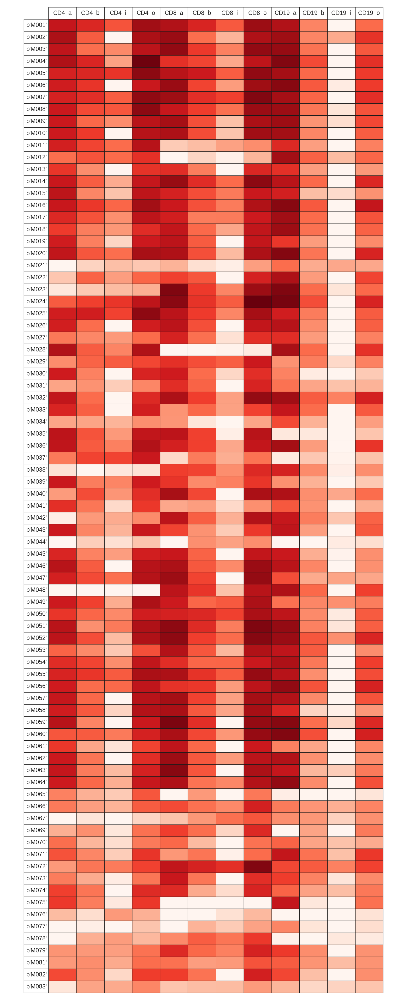

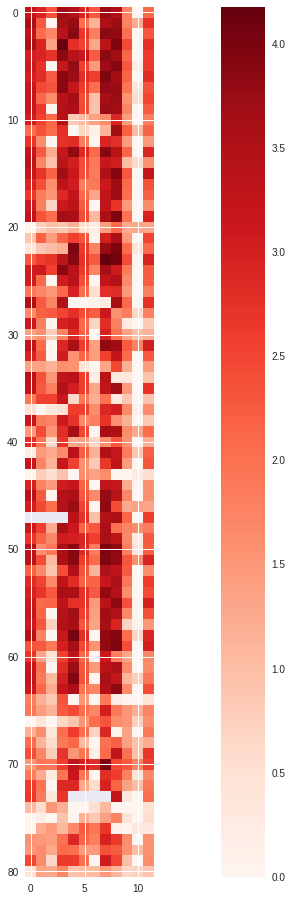

In [93]:
## Make fancy heatmap table
vals = numpy.around(df2.values, 3)

#Normalize data to [0, 1] range for color mapping below
normal = (df2 - 0) / (4.2 - 0)

fig = plt.figure(dpi=300)
ax = fig.add_subplot(111)
ax.axis('off')
the_table=ax.table(rowLabels=xsList, colLabels=df2.columns, loc='center', cellColours=plt.cm.Reds(normal),animated=True)
plt.show()

fig = plt.figure(figsize=(24,16))
plt.imshow(df2, origin="upper", cmap='Reds')
plt.colorbar()
plt.show()
